# **Group Assignment** - Bike Sharing

*The administration of Washington D.C wants to make a deeper analysis of the usage of the bike-sharing service present in the city in order to build a predictor model that helps the public transport department anticipate better the provisioning of bikes in the city. For these purposes, some data is available for the years 2011 and 2012.*


**Main goals**
As part of the team of the hired consultancy firm, your work is to build an interactive, insightful and complete report about the bike-sharing service in the city for the head of transportation services of the local government. As part of the requirements, there are two big points:

- The customer wants a deep analysis of the bike-sharing service. He wants to know how the citizens are using the service in order to know if some changes must be made to optimize costs or provide a better service.
- The customer also wants a predictive model able to predict the total number of bicycle users on an hourly basis. They believe this will help them in the optimization of bike provisioning and will optimize the costs incurred from the outsourcing transportation company.

________________________________________________
_____________________________________________________

# PART I: Data Analysis (descriptive analytics) (3 points)

- Ensuring data quality (correctness, consistency, missing values, outliers...).
- Plotting clear and meaningful figures.
- Giving insights on what seems relevant for prediction and what does not.
- Discussion on missing values and outliers
- Treatment of text and date features
- Generation of extra features (e.g., season, yes/no holiday, hours of daylight, combinations of features, quantization/binarization, polynomial features)
- Provide useful explanations about the decisions taken and the results obtained


___________________________________________

## 1.1 Data Prep & Cleaning
We are focusing on the data quality in the following steps (correctness, consistency, missing values, outliers...).

In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

This following code is used if you run the notebook in **Google Colab**

In [2]:
"""# We are mounting the google drive to access the data. So the notebook can be run from anywhere.
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

source_folder='/content/drive/My Drive/bike-sharing-hourly.csv' # depending on where you have stored the data

data=pd.read_csv(source_folder)

data.head(2)"""

"# We are mounting the google drive to access the data. So the notebook can be run from anywhere.\nfrom google.colab import drive\ndrive.mount('/content/drive',force_remount=True)\n\nsource_folder='/content/drive/My Drive/bike-sharing-hourly.csv' # depending on where you have stored the data\n\ndata=pd.read_csv(source_folder)\n\ndata.head(2)"

This code is used if you run the notebook from any other IDE then Google Colab

In [3]:
source_folder='/Users/elisabethoeljeklaus/IE_MBD/06_Python_for_Data_Analysis/02/group06/bike-sharing-hourly.csv' # depending on where you have stored the data

data=pd.read_csv(source_folder)

data.head(2)

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40


**The following are the columns our csv files contains:**
- `instant`: record index
- `dteday` : date
- `season` : season 1:winter, 2:spring, 3:summer, 4:fall
- `yr` : year (0: 2011, 1:2012)
- `mnth` : month ( 1 to 12)
- `hr` : hour (0 to 23)
- `holiday` : weather day is holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
- `weekday` : day of the week
- `workingday` : if day is neither weekend nor holiday is 1, otherwise is 0.
+ `weathersit` :
	- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
	- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
	- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
	- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
- `temp` : Normalized temperature in Celsius. The values are divided to 41 (max)
- `atemp`: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
- `hum`: Normalized humidity. The values are divided to 100 (max)
- `windspeed`: Normalized wind speed. The values are divided to 67 (max)
- `casual`: count of casual users
- `registered`: count of registered users
- `cnt`: count of total rental bikes including both casual and registered

_________________________________

### 1.1.1 Check Data Types

In [4]:
data.dtypes

instant         int64
dteday         object
season          int64
yr              int64
mnth            int64
hr              int64
holiday         int64
weekday         int64
workingday      int64
weathersit      int64
temp          float64
atemp         float64
hum           float64
windspeed     float64
casual          int64
registered      int64
cnt             int64
dtype: object

In [5]:
data.set_index('instant',inplace=True) # set instant as index as this is the index of the dataset

data['hr_2']=data['hr'].astype(str).str.zfill(2) # add a leading zero to the hour to have a consistent format
data['datetime']=data['dteday']+' '+data['hr_2']+':00' # create a datetime column
data['datetime']=pd.to_datetime(data['datetime']) # convert the datetime column to datetime format
data['dteday']=pd.to_datetime(data['dteday']) # convert the dteday column to datetime format
data.drop(columns='hr_2',inplace=True) # drop the hr_2 column

**OBSERVATION**:

- All the data is *already in numeric format* (either as true numeric or as label,binary encoded variable) except of `dteday` which is the date

_________________________________

### 1.1.2 Check for Null values

In [6]:
data.isnull().sum()/(data.count()+data.isnull().sum())*100 ## no null values

dteday        0.0
season        0.0
yr            0.0
mnth          0.0
hr            0.0
holiday       0.0
weekday       0.0
workingday    0.0
weathersit    0.0
temp          0.0
atemp         0.0
hum           0.0
windspeed     0.0
casual        0.0
registered    0.0
cnt           0.0
datetime      0.0
dtype: float64

**OBSERVATION**:
- Does `NOT contain any NULL Values`.

_______________________________

### 1.1.3 Check consistency

The code checks if the sum of the 'registered' and 'casual' columns is equal to the 'cnt' column for all rows in the 'data' dataframe.
 If there is any row where this condition is not true, it returns True, otherwise it returns False.


In [7]:
# Check consistency
(data['cnt']!=(data['registered']+data['casual'])).any() # ---> cnt always the sum of registered and casual

False

**OBSERVATION**:
- The `Casual`and `Registered` Column **is equal** to the `cnt` column

_______________________________________________________

### 1.1.4 Check Dates Availability

In [8]:
time_diff = data['datetime'].diff().dt.total_seconds().fillna(0) # calculate the time difference between observation

#divmod() is a built-in function in Python 3 to perform floor division and modulo operation.

hours, remainder = divmod(time_diff.mean(), 3600) # calculate the average time difference between observations with mean() in HOURS
minutes, _ = divmod(remainder, 60) # calculate the average time difference between observations with mean() in MINUTES
print(f"The average time difference between observations is {int(hours):02d}:{int(minutes):02d} h")

The average time difference between observations is 01:00 h


In [9]:
# Generate a sequence of dates from start date to end date
start_date = '2011-01-01 00:00:00'
end_date = '2012-12-31 00:00:00'
date_range = pd.date_range(start=start_date, end=end_date, freq='H')  # Assuming hourly frequency

# Check for missing dates
missing = set(date_range) - set(data['datetime'])

# If there are missing dates, the 'missing_dates' set will contain those dates
if missing:
    print("Missing dates in 'dteday' column:")
    print(sorted(missing))

else:
    print("No missing dates in 'dteday' column.")


len(missing) # 165 missing entries which were not in the original dataset


Missing dates in 'dteday' column:
[Timestamp('2011-01-02 05:00:00'), Timestamp('2011-01-03 02:00:00'), Timestamp('2011-01-03 03:00:00'), Timestamp('2011-01-04 03:00:00'), Timestamp('2011-01-05 03:00:00'), Timestamp('2011-01-06 03:00:00'), Timestamp('2011-01-07 03:00:00'), Timestamp('2011-01-11 03:00:00'), Timestamp('2011-01-11 04:00:00'), Timestamp('2011-01-12 03:00:00'), Timestamp('2011-01-12 04:00:00'), Timestamp('2011-01-14 04:00:00'), Timestamp('2011-01-18 00:00:00'), Timestamp('2011-01-18 01:00:00'), Timestamp('2011-01-18 02:00:00'), Timestamp('2011-01-18 03:00:00'), Timestamp('2011-01-18 04:00:00'), Timestamp('2011-01-18 05:00:00'), Timestamp('2011-01-18 06:00:00'), Timestamp('2011-01-18 07:00:00'), Timestamp('2011-01-18 08:00:00'), Timestamp('2011-01-18 09:00:00'), Timestamp('2011-01-18 10:00:00'), Timestamp('2011-01-18 11:00:00'), Timestamp('2011-01-19 03:00:00'), Timestamp('2011-01-22 05:00:00'), Timestamp('2011-01-23 04:00:00'), Timestamp('2011-01-24 02:00:00'), Timestamp('20

165

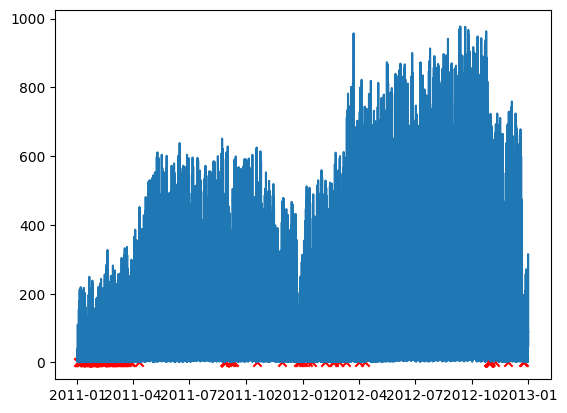

In [10]:
import matplotlib.pyplot as plt
# Plot datetime
plt.plot(data['datetime'], data['cnt'])

# Add missing values as points
for date in missing:
    plt.scatter(date, 0, color='red', marker='x')

plt.show()

In [11]:
"""missing = np.array(list(missing), dtype='object')
shape_old=data.shape
print(data.shape)
additional_times=pd.DataFrame(columns=data.columns)
additional_times['datetime']=pd.Series(missing)
additional_times['dteday']=missing.astype(str)
additional_times['yr']=pd.Series(missing).dt.year
additional_times['mnth']=pd.Series(missing).dt.month
additional_times['hr']=pd.Series(missing).dt.hour
additional_times['weekday']=pd.Series(missing).dt.dayofweek
additional_times['workingday']= np.is_busday(pd.Series(missing).values.astype('datetime64[D]'))
additional_times['holiday']
data=pd.concat([data,additional_times],ignore_index=True)
print(f"new shape of data:' {data.shape}")
print(f"chekc if corr. added {data.shape[0]-shape_old[0]==165}")"""

'missing = np.array(list(missing), dtype=\'object\')\nshape_old=data.shape\nprint(data.shape)\nadditional_times=pd.DataFrame(columns=data.columns)\nadditional_times[\'datetime\']=pd.Series(missing)\nadditional_times[\'dteday\']=missing.astype(str)\nadditional_times[\'yr\']=pd.Series(missing).dt.year\nadditional_times[\'mnth\']=pd.Series(missing).dt.month\nadditional_times[\'hr\']=pd.Series(missing).dt.hour\nadditional_times[\'weekday\']=pd.Series(missing).dt.dayofweek\nadditional_times[\'workingday\']= np.is_busday(pd.Series(missing).values.astype(\'datetime64[D]\'))\nadditional_times[\'holiday\']\ndata=pd.concat([data,additional_times],ignore_index=True)\nprint(f"new shape of data:\' {data.shape}")\nprint(f"chekc if corr. added {data.shape[0]-shape_old[0]==165}")'

In [12]:
data.sort_values(by='datetime',inplace=True)

data.loc[data['datetime'].isin(missing),:]

,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,datetime
instant,,,,,,,,,,,,,,,,,


In [13]:
# New null values count
data.isnull().sum()/(data.count()+data.isnull().sum())*100

# ---> there are null values now


dteday        0.0
season        0.0
yr            0.0
mnth          0.0
hr            0.0
holiday       0.0
weekday       0.0
workingday    0.0
weathersit    0.0
temp          0.0
atemp         0.0
hum           0.0
windspeed     0.0
casual        0.0
registered    0.0
cnt           0.0
datetime      0.0
dtype: float64

In [14]:
len(data['datetime'].unique()) #entries
165/(17379+165) # 0.009% of the data is missing

0.009404924760601915

In [15]:
#sorted(missing) to find out if there is a patter

#are days in the same month ?
#are days in the same season ?

#are days weekends ?
for i in sorted(missing):
    if i.dayofweek == 5 or i.dayofweek == 6:
        print(i, 'is a weekend')

2011-01-02 05:00:00 is a weekend
2011-01-22 05:00:00 is a weekend
2011-01-23 04:00:00 is a weekend
2011-01-29 05:00:00 is a weekend
2011-01-30 06:00:00 is a weekend
2011-02-13 05:00:00 is a weekend
2011-02-20 05:00:00 is a weekend
2011-02-27 05:00:00 is a weekend
2011-03-06 05:00:00 is a weekend
2011-03-13 02:00:00 is a weekend
2011-03-27 05:00:00 is a weekend
2011-08-27 18:00:00 is a weekend
2011-08-27 19:00:00 is a weekend
2011-08-27 20:00:00 is a weekend
2011-08-27 21:00:00 is a weekend
2011-08-27 22:00:00 is a weekend
2011-08-27 23:00:00 is a weekend
2011-08-28 00:00:00 is a weekend
2011-08-28 01:00:00 is a weekend
2011-08-28 02:00:00 is a weekend
2011-08-28 03:00:00 is a weekend
2011-08-28 04:00:00 is a weekend
2011-08-28 05:00:00 is a weekend
2011-08-28 06:00:00 is a weekend
2011-12-25 04:00:00 is a weekend
2012-03-11 02:00:00 is a weekend


In [16]:
data.shape

(17379, 17)

**OBSERVATION**:

- `Inspection of not existing hourly records`:
    - Average is 1 h between each entry
    - gives *impression of randomness.* Many records are early in the morning but few/some also during noon where activity  
    - Every missing entry was on a weekend this is the only impression of no randomness of the missing data
- `Conclusion`:
     **165** entries missing
    - makes up to 0.009% --> we decided to ignore!


____________________________________

## 1.2 Plotting - EDA

In [17]:
data.describe(include='all')

,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,datetime
count,17379,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379
mean,2012-01-02 04:08:34.552045568,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088,2012-01-02 15:41:22.858622464
min,2011-01-01 00:00:00,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2011-01-01 00:00:00
25%,2011-07-04 00:00:00,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000,2011-07-04 22:30:00
50%,2012-01-02 00:00:00,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000,2012-01-02 21:00:00
75%,2012-07-02 00:00:00,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000,2012-07-02 06:30:00
max,2012-12-31 00:00:00,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000,2012-12-31 23:00:00
std,NaN,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599,NaN


In [18]:
data.dtypes

dteday        datetime64[ns]
season                 int64
yr                     int64
mnth                   int64
hr                     int64
holiday                int64
weekday                int64
workingday             int64
weathersit             int64
temp                 float64
atemp                float64
hum                  float64
windspeed            float64
casual                 int64
registered             int64
cnt                    int64
datetime      datetime64[ns]
dtype: object

In [19]:
"""# Check datatype that changed through appending the new data values
data['season']=data['season'].astype(float)
data['holiday']=data['holiday'].astype(float)
data['weathersit']=data['weathersit'].astype(float)
data['casual']=data['casual'].astype(float)
data['registered']=data['registered'].astype(float)
data['cnt']=data['cnt'].astype(float)
data.dtypes"""

"# Check datatype that changed through appending the new data values\ndata['season']=data['season'].astype(float)\ndata['holiday']=data['holiday'].astype(float)\ndata['weathersit']=data['weathersit'].astype(float)\ndata['casual']=data['casual'].astype(float)\ndata['registered']=data['registered'].astype(float)\ndata['cnt']=data['cnt'].astype(float)\ndata.dtypes"

**OBSERVATION**

All variables show reasonable basic stats apart from **windspeed** and the **target variables (casual, registered, cnt)**
 - very high max values , much higher than 1.5*IQR
 - --> see more details in boxplot and further check for outliers part

_____________________________________

### 1.2.1 Analyse Behaviour of targets

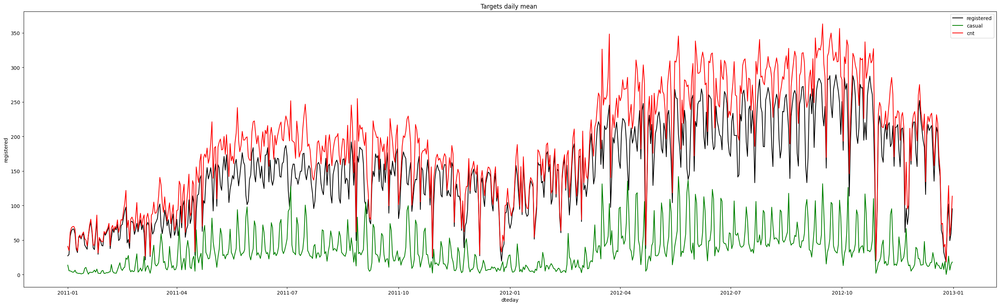

In [20]:
# Daily Frequency

plt.figure(figsize=(35, 10))
plt.title('Targets daily mean ')
sns.lineplot(data,x='dteday',y='registered',label='registered',color='black',errorbar=None)
sns.lineplot(data,x='dteday',y='casual',label='casual',color='green',errorbar=None)
sns.lineplot(data,x='dteday',y='cnt',label='cnt',color='red',errorbar=None)

plt.legend()
plt.show()



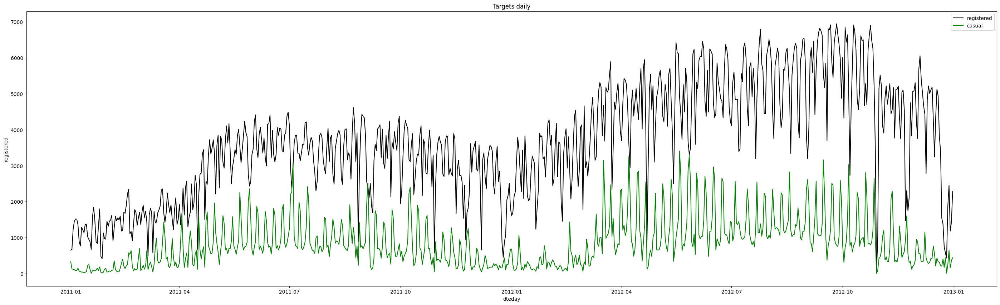

In [21]:
plt.figure(figsize=(35, 10))
plt.title('Targets daily mean ')


df_agg= pd.DataFrame(data.groupby(['dteday'])[['registered','casual']].sum())
plt.title('Targets daily')
sns.lineplot(data=df_agg,x='dteday',y='registered',label='registered',color='black',errorbar=None)
sns.lineplot(data=df_agg,x='dteday',y='casual',label='casual',color='green',errorbar=None)

plt.legend()
plt.show()

**OBSERVATION**
 - `Casual`: Less acitvity in winter, apprently strong seasonality,
 - `Registered`: lower activity in winter but drop to a smaller extent compared to casual
 - `General`: A couple of strong low outliers: e.g. Oct 29 but prob related to hurricane Sandy

_____________________________

### 1.2.2 Analyse Seasonality

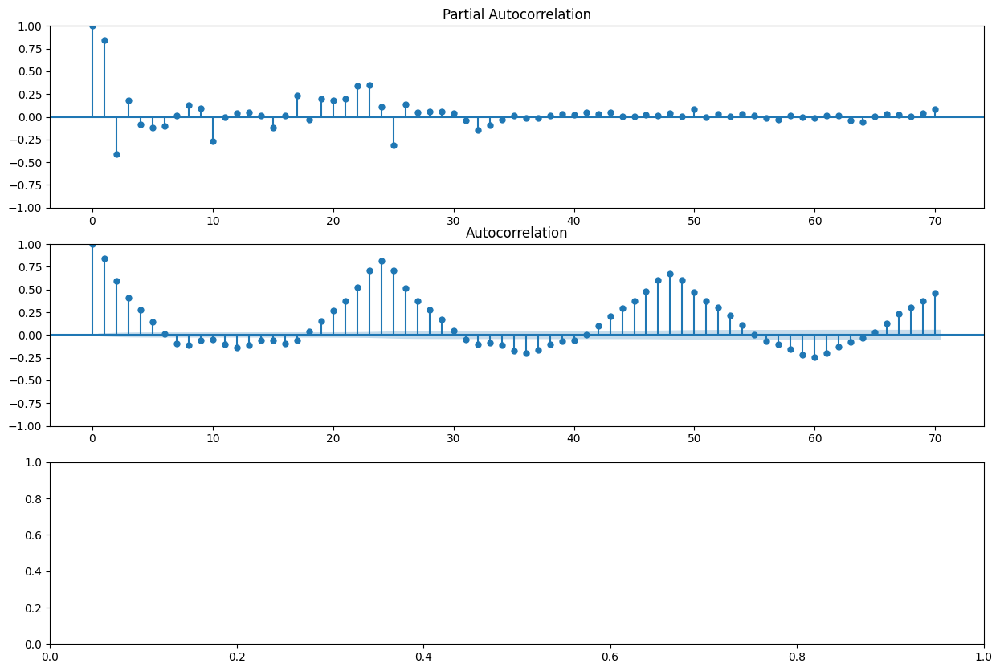

In [22]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plot historical data (train data)
nlags=70
fig, ax = plt.subplots(3,1, figsize = (15,10))
plot_pacf(data['cnt'], lags = nlags, method="ols", ax=ax[0])
plot_acf(data['cnt'], lags = nlags, ax=ax[1])
plt.show()


**OBSERVATION**
 - We see a `clear daily seasonality and significant first 2-3 lags`.

_____________________________________________

### 1.2.3 Check for outliers etc.

season


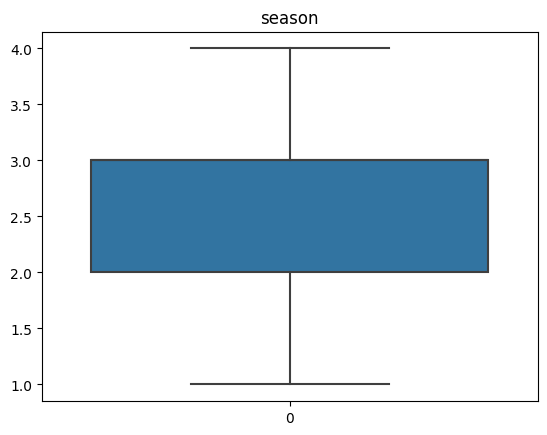

yr


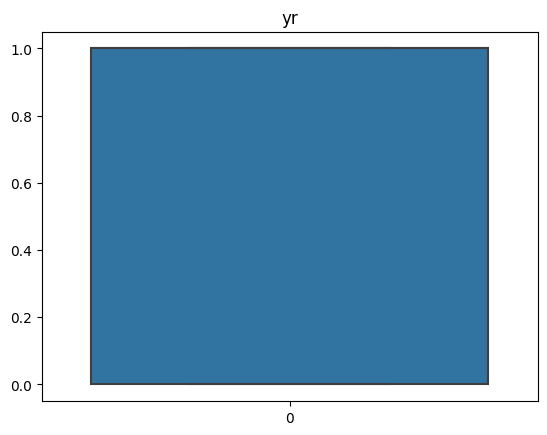

mnth


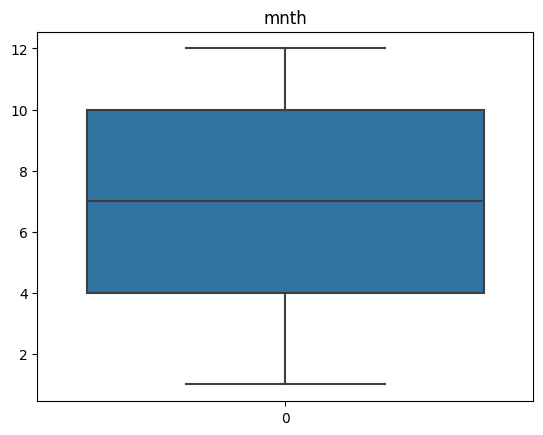

hr


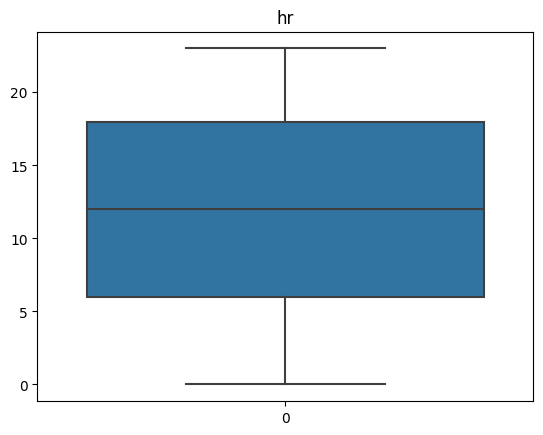

holiday


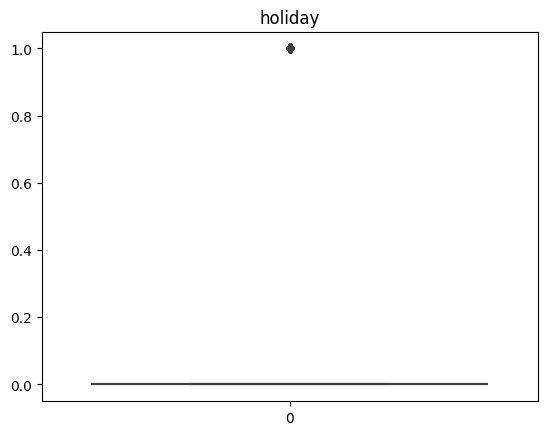

weekday


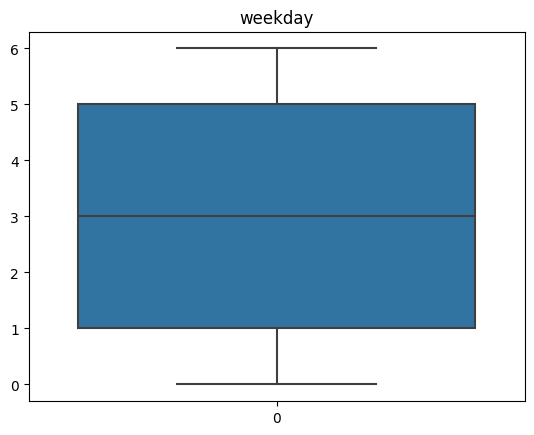

workingday


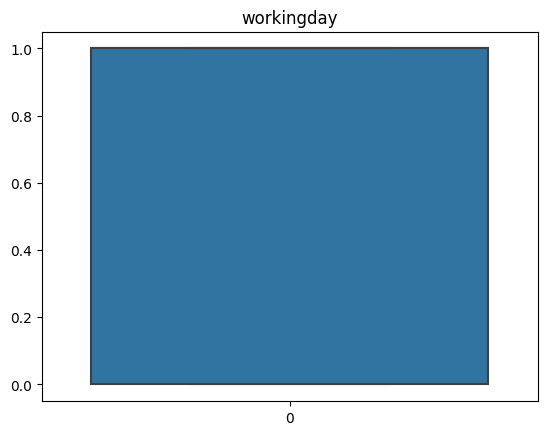

weathersit


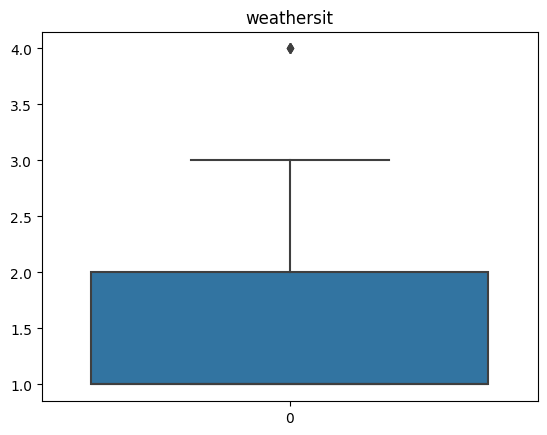

temp


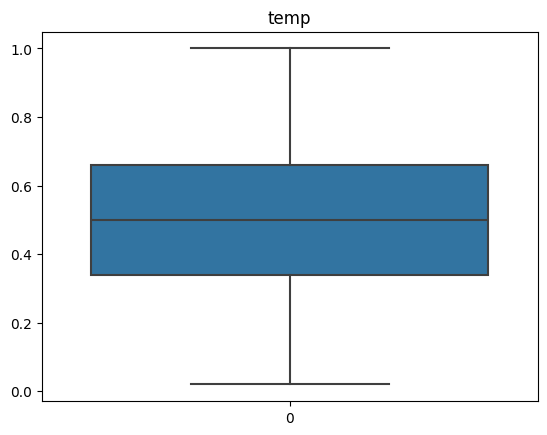

atemp


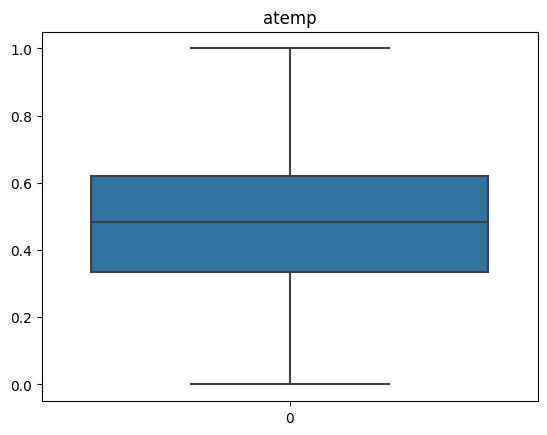

hum


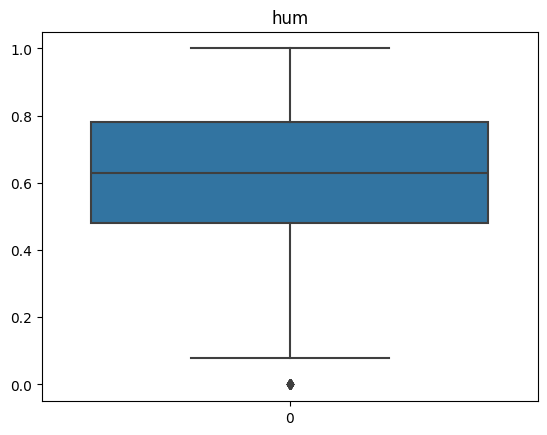

windspeed


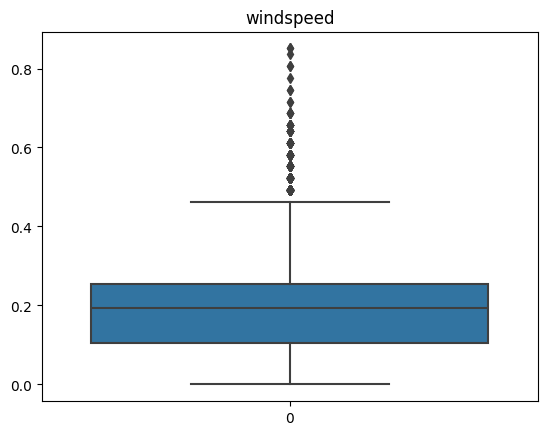

casual


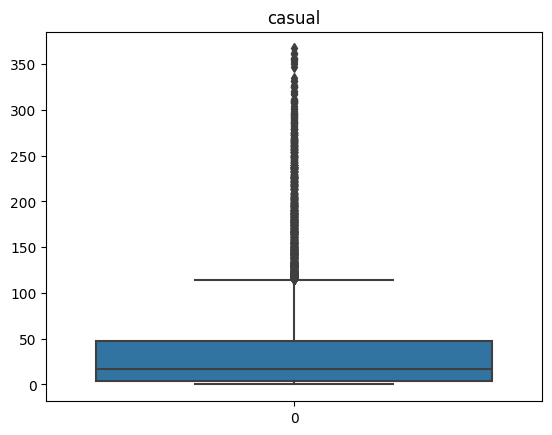

registered


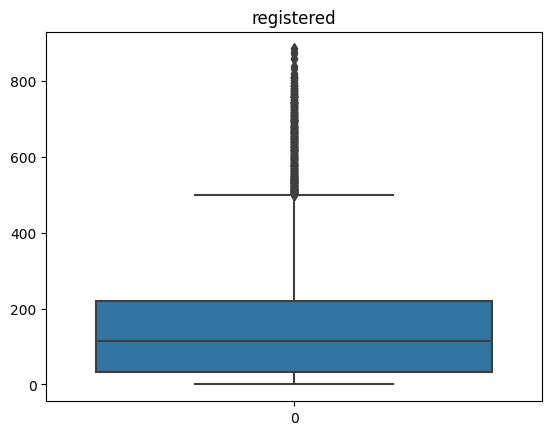

cnt


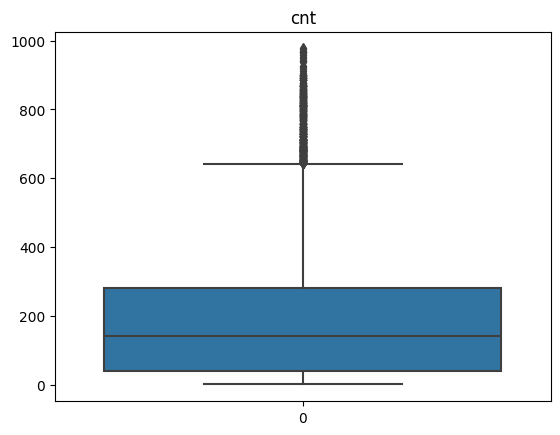

In [23]:
for col in data.select_dtypes(['int','float']):
  print(col)
  plt.title(col)
  sns.boxplot(data=data[col].values)#,label=col)
  plt.show()

**OBSERVATION**:

 - Casual, registered and count have some severe outliers to max
 - `weathitsit` --> mostly between 1-2 rarely 3 and very rare is 4
 - `hum` --> very rare at 0
 - `windspeed` : mostly between 1.8-0.23 a couple of extreme values (above 75Percentile at 0.5 above up until 0.8x)
 - `casual`: mostly 0-50 75Percentile~110, some outliers above up until 360
 - `registered`: mostly between 50-210 75% at ~460 , many outliers above , max is 800x

________________________________

### 1.2.4 Pairplot

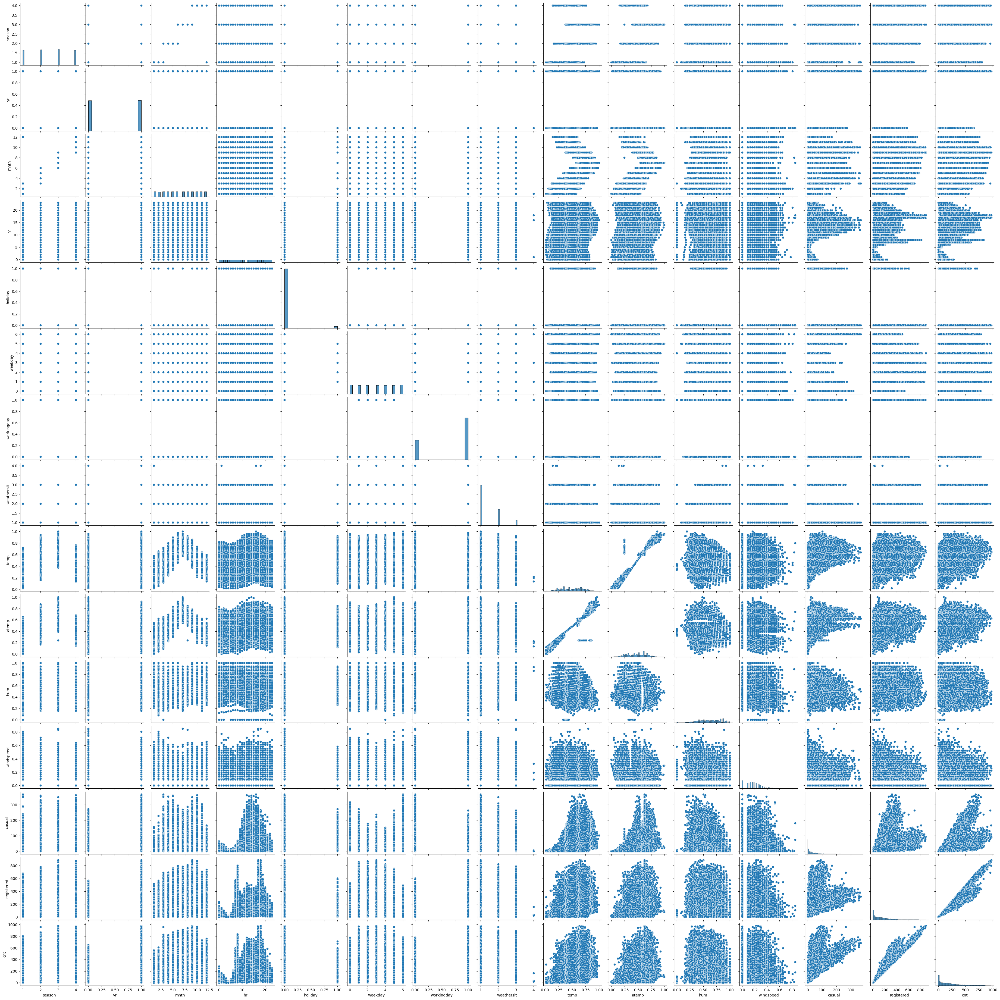

In [24]:
sns.pairplot(data)

**OBSERVATION**

- in both classes usage become more popular from year 2 to year 1
- `ALL USERS`:
   - are sensitive to our weatherit , if weather is 4 (Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog) then low usage
   - when humidity is very low then no usage or only very few
   - with increasing windspeed the usage in both groups goes down
- `Registered users`:
   - use bikes more/primarily during morning and back during evening (maybe these are workers)
   - registered users are using it the service more during the week
   - registered users are less sensivitve to low temperatrues
- `Casual users`:
   - usage increases during the day and peaks around 7 a clock (this peak interfers with the 2nd peak of registered users
   - casual users are more busy using the bikes during the weekend
   - casual users are more sensitvie to low temperatures and use the bikes less often
- `Relationships insights`:
   - potentially Quadratic relationship --> month,weekday,temp,atemp,hum with targets
   - cubic --> hr with targets

_________________________________

###  1.2.5 Analyse seasonality **WEEKLY** different patterns?

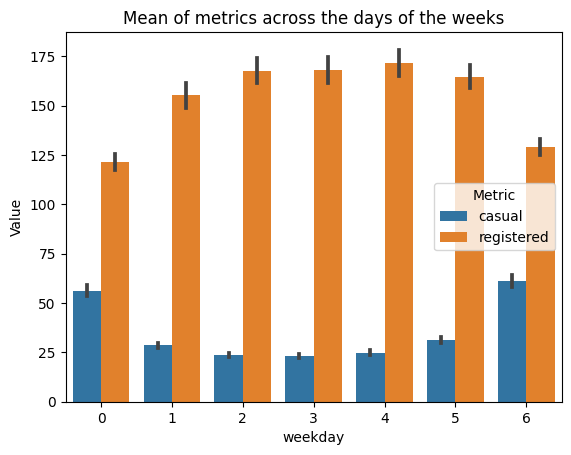

In [25]:
data_long=pd.melt(data,id_vars='weekday',value_vars=['casual','registered'],var_name='Metric',value_name='Value')
sns.barplot(data=data_long,x='weekday',y='Value',hue='Metric')
plt.title('Mean of metrics across the days of the weeks')
plt.show()

**OBSERVATION**
As suspected in the pairplot we see 2 compeltetly different user behaviours.
- `Casual users`are more busy during the weekend.
- `Registered users` users during the week.

-----------------------------------------------------

###  1.2.6 Analyse seasonality **HOURLY** different patterns?

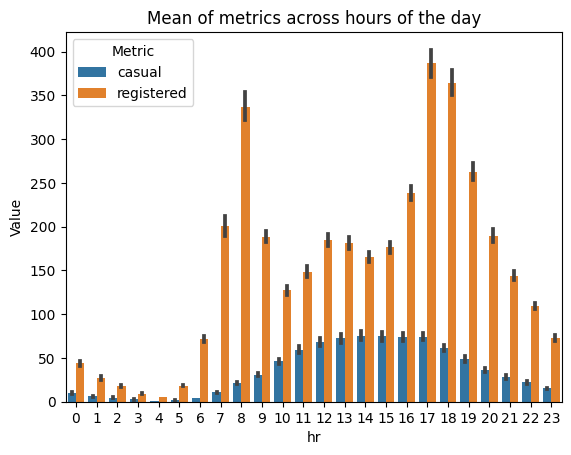

In [26]:
data_long=pd.melt(data,id_vars='hr',value_vars=['casual','registered'],var_name='Metric',value_name='Value')
plt.title('Mean of metrics across hours of the day')
sns.barplot(data=data_long,x='hr',y='Value',hue='Metric')
plt.show()

**OBSERVATION**

As suspected in the pairplot we see 2 compeltetly different user behaviours.
- `Casual users` are more busy mid of the day.
- `Registered users` peak in the morning and the evening (hence likley to be working people, people who use the service to get to work)

------------------------------------------

### 1.2.7 Analyse Seasonalty **MONTHLY** different patterns?

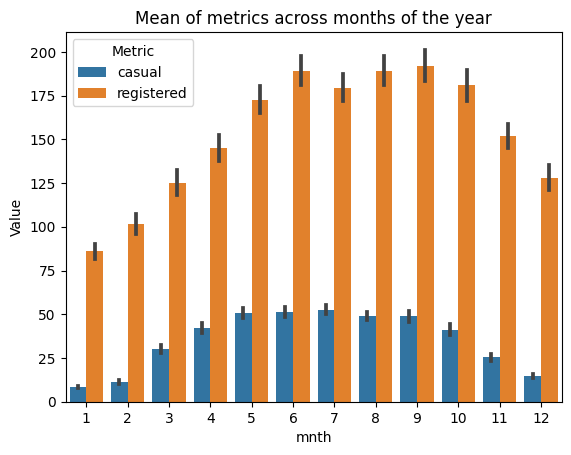

In [27]:
data_long=pd.melt(data,id_vars='mnth',value_vars=['casual','registered'],var_name='Metric',value_name='Value')
plt.title('Mean of metrics across months of the year')
sns.barplot(data=data_long,x='mnth',y='Value',hue='Metric')
plt.show()

**OBSERVATION**

We see 2 the same  user behaviour for both groups."
- `Casual users`and `Registered users`: Are using the bike sharing service more between.
- Only noting that registered users use the bikes slightly less in July compared to the other months from June till September "
    

_______________________________

### 1.2.8 Analys Seasonality by **SEASONS** - different patterns??





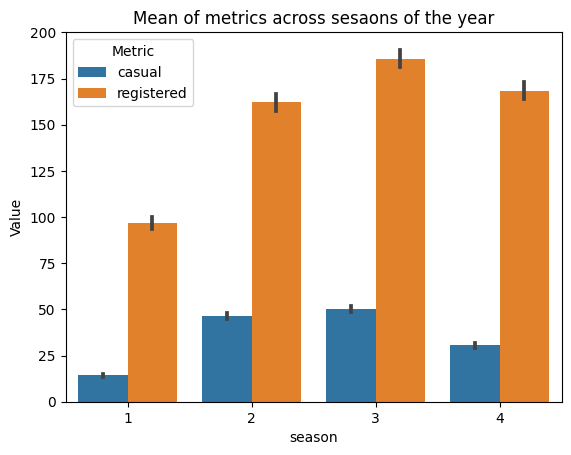

In [28]:
data_long=pd.melt(data,id_vars='season',value_vars=['casual','registered'],var_name='Metric',value_name='Value')
plt.title('Mean of metrics across sesaons of the year')
sns.barplot(data=data_long,x='season',y='Value',hue='Metric')
plt.show()

**OBSERVATION**

We see the same user behaviour for both groups.
- `Casual users`and `Registered users`: Use the bike sharing service more during fall and summer



----------------------------------------------

### 1.2.9. Analysis Seasonality by **HOLIDAYS** - differrent patterns?

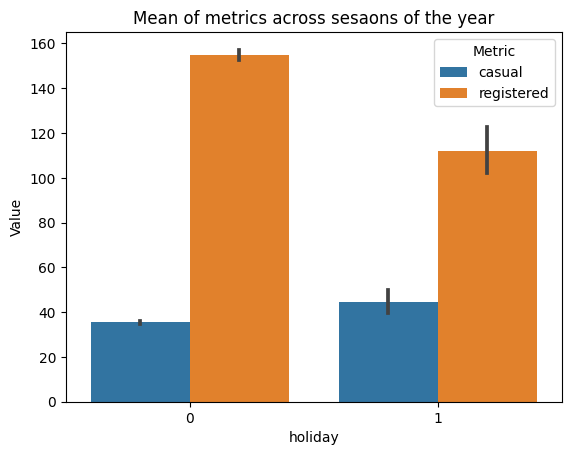

In [29]:
data_long=pd.melt(data,id_vars='holiday',value_vars=['casual','registered'],var_name='Metric',value_name='Value')
plt.title('Mean of metrics across sesaons of the year')
sns.barplot(data=data_long,x='holiday',y='Value',hue='Metric')
plt.show()

### 1.2.10 **TEMPERATURE** Influence

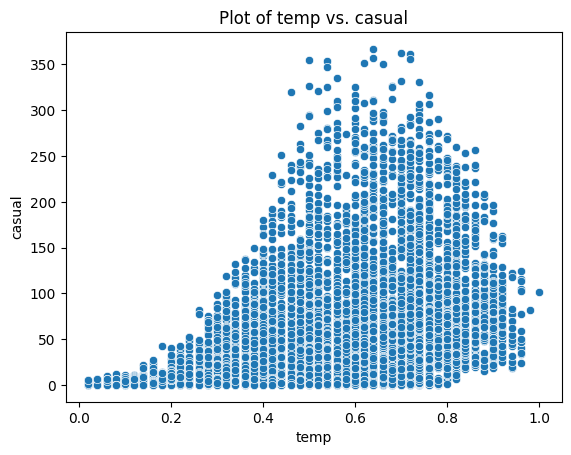

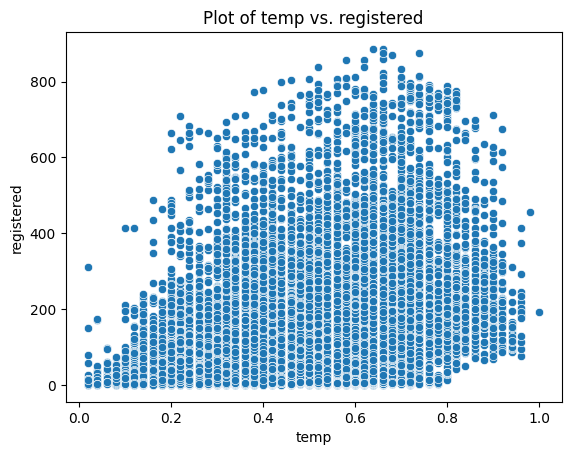

In [30]:
sns.scatterplot(x='temp',y='casual',data=data)
plt.title('Plot of temp vs. casual')
plt.show()

sns.scatterplot(x='temp',y='registered',data=data)
plt.title('Plot of temp vs. registered')
plt.show()

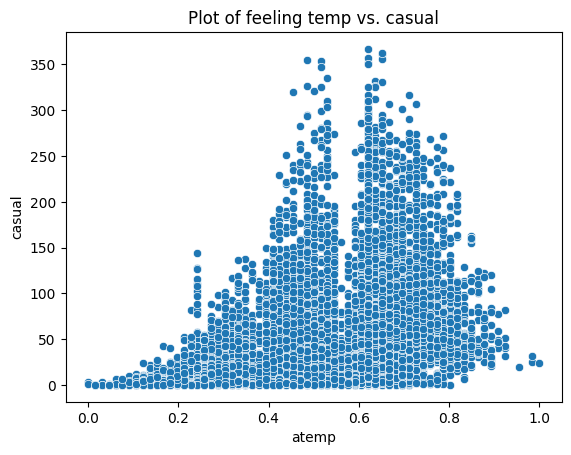

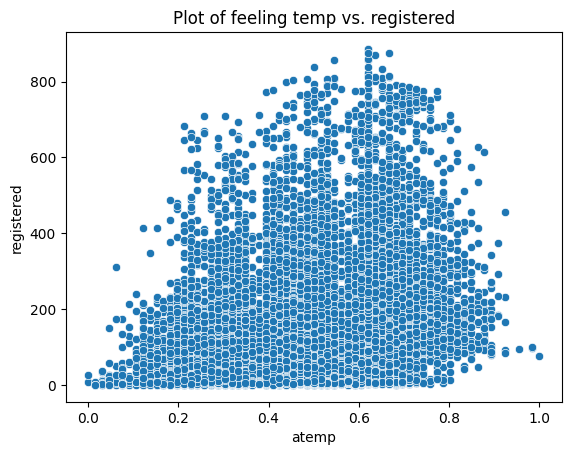

In [31]:
sns.scatterplot(x='atemp',y='casual',data=data)
plt.title('Plot of feeling temp vs. casual')
plt.show()

sns.scatterplot(x='atemp',y='registered',data=data)
plt.title('Plot of feeling temp vs. registered')
plt.show()

**OBSERVATION**

As suspected in the pairplot we see 2 compeltetly different user behaviours.
- `Casual users`  are very sensitive to temp --> the more extreme  the temp the lower the usage (proven by pairplot as well)
- `Registered users` less senstivie to lower temperatues but generally if the temperatures are moderate the usage is the highest

--------------------------------------------

### 1.2.11 **WEATHER** Influence

The code below is plotting the mean of the `casual` and `registered` metrics across different weather situations (`weathersit`).

It starts by using the `pd.melt()` function to transform the `data` dataframe from wide to long format, with `weathersit` as the id variable and `casual` and `registered` as the value variables. The resulting dataframe is stored in `data_long`.

Then, it creates a bar plot using `sns.barplot()` from the Seaborn library, with `weathersit` on the x-axis, `Value` (which contains the values of `casual` and `registered`) on the y-axis, and `Metric` (which indicates whether the values are for `casual` or `registered`) as the hue.

Finally, it adds a title to the plot using `plt.title()` and displays the plot using `plt.show()`.

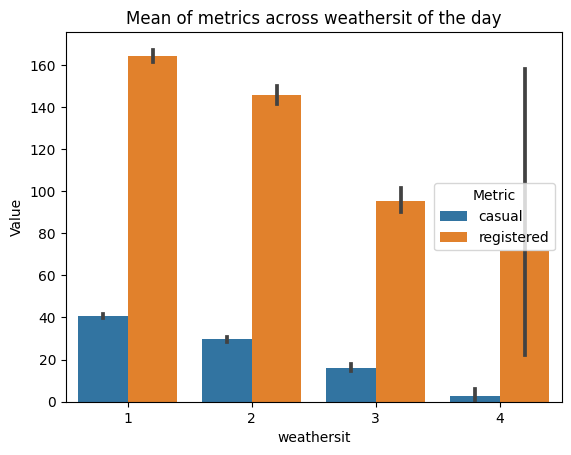

In [32]:
data_long=pd.melt(data,id_vars='weathersit',value_vars=['casual','registered'],var_name='Metric',value_name='Value')
plt.title('Mean of metrics across weathersit of the day')
sns.barplot(data=data_long,x='weathersit',y='Value',hue='Metric')
plt.show()

**OBSERVATION**:

- `ALL USERS`:
   - are sensitive to our weatherit , if weather is 4 (Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog) then low usage

--------------------------------

### 1.2.12 First Correlation insights

In [33]:
data.dtypes

dteday        datetime64[ns]
season                 int64
yr                     int64
mnth                   int64
hr                     int64
holiday                int64
weekday                int64
workingday             int64
weathersit             int64
temp                 float64
atemp                float64
hum                  float64
windspeed            float64
casual                 int64
registered             int64
cnt                    int64
datetime      datetime64[ns]
dtype: object

              dteday    season        yr      mnth        hr   holiday  \
dteday      1.000000  0.404452  0.865648  0.489808 -0.006161  0.014737   
season      0.404452  1.000000 -0.010742  0.830386 -0.006117 -0.009585   
yr          0.865648 -0.010742  1.000000 -0.010473 -0.003867  0.006692   
mnth        0.489808  0.830386 -0.010473  1.000000 -0.005772  0.018430   
hr         -0.006161 -0.006117 -0.003867 -0.005772  1.000000  0.000479   
holiday     0.014737 -0.009585  0.006692  0.018430  0.000479  1.000000   
weekday     0.001372 -0.002335 -0.004485  0.010400 -0.003498 -0.102088   
workingday -0.003366  0.013743 -0.002196 -0.003477  0.002285 -0.252471   
weathersit -0.014063 -0.014524 -0.019157  0.005400 -0.020203 -0.017036   
temp        0.136074  0.312025  0.040913  0.201691  0.137603 -0.027340   
atemp       0.137543  0.319380  0.039222  0.208096  0.133750 -0.030973   
hum         0.010196  0.150625 -0.083546  0.164411 -0.276498 -0.010588   
windspeed  -0.074645 -0.149773 -0.0087

<Axes: >

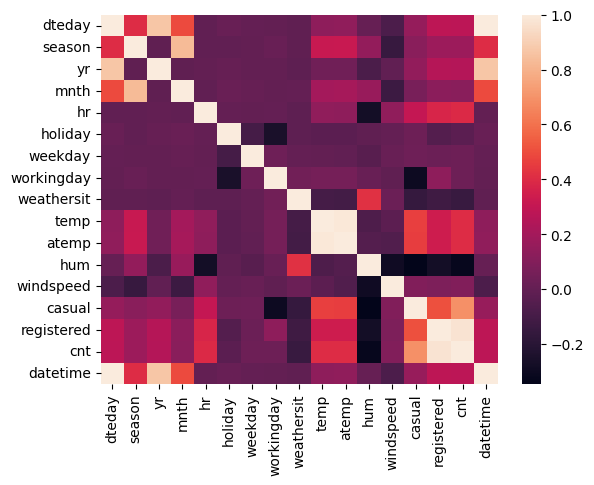

In [34]:
correlation_matrix= data.corr()
print(correlation_matrix)

sns.heatmap(data.corr())

In [35]:

# Variable Importances of target=casual
variable_importance=pd.DataFrame()
target='casual'
variable_importance[target]=abs(correlation_matrix.loc[~correlation_matrix.index.isin([target,'registered','cnt']),target]).sort_values(ascending=False)

# Variable Importances of target=registered
target='registered'
variable_importance[target]=abs(correlation_matrix.loc[~correlation_matrix.index.isin([target,'casual','cnt']),target]).sort_values(ascending=False)

# joint variable importance
print(pd.DataFrame(variable_importance.loc[:,['casual','registered']]))


              casual  registered
temp        0.459616    0.335361
atemp       0.454080    0.332559
hum         0.347028    0.273933
hr          0.301202    0.374141
workingday  0.300942    0.134326
datetime    0.158235    0.281965
dteday      0.157821    0.281450
weathersit  0.152628    0.120966
yr          0.142779    0.253684
season      0.120206    0.174226
windspeed   0.090287    0.082321
mnth        0.068457    0.122273
weekday     0.032721    0.021578
holiday     0.031564    0.047345


**OBSERVATION**

 - As suspected we see that the Temperature and the Humidity have the highest corelation with both targets `Casual users` and `Registered users`

---------------------------------------------

###  1.2.13 Remove predictors with high correlation

In [36]:
max_pred_corr=0.90   ## Threshold for highly correlated predictors

corr_vars={}
for i in range(len(correlation_matrix.columns)):
    vars=[]
    for j in range(i):
      # Check which features have corr> threshold with another predictor variabel
      if (abs(correlation_matrix.iloc[i, j]) > max_pred_corr) and (i != j) and (correlation_matrix.index[i] not in ['registered','casual']) and (correlation_matrix.index[j] not in ['registered','casual']):
          corr_vars[correlation_matrix.index[i]]=correlation_matrix.index[j]


print(f'predictors with high correaltion (> {max_pred_corr} ) are these: {corr_vars}')


# Check corr of highly correlated predictors with each target

#get correaltion of the values in the key of the dictionary and get the corr with the targets
corr_key= list(corr_vars.keys())[0]
corr_key=correlation_matrix.loc[correlation_matrix.index==corr_key,['registered','casual']].reset_index(drop=True)

#get correaltion of the values in the value of the dictionary and get the corr with the targets
corr_value= list(corr_vars.values())[0]
corr_value=correlation_matrix.loc[correlation_matrix.index==corr_value,['registered','casual']].reset_index(drop=True)

(corr_key>corr_value).any()==True ## --> as correlation with targets of the key (here: atemp) is always smaller or equal to the corr of value (here: temp) with both targets
                                  ## we can drop the key == atemp


# As seen above we can drop atemp as its corr with temp is >threshold and its corr with both targets is always smaller than the corr of temp with target
data.drop(columns='atemp',inplace=True)

predictors with high correaltion (> 0.9 ) are these: {'atemp': 'temp', 'datetime': 'dteday'}


In [37]:
#save the data and keep index as it is
data.to_csv('data_cleaned.csv',index=True)


____________________________________________

__________________________________________________________

# PART II: Prediction Model

- Machine Learning (predictive analytics) (3 points)
- Choosing the best model to solve the problem (linear and non-linear).
- Split data correctly to train and test your models
- Tuning model parameters with validation
- Obtaining accurate predictions in tests
- Plotting predictions vs. reality for additional insights
- Deep analysis of results and insights given the features
- Provide explanations about the decisions taken (chosen model, hyperparameter settings, evaluation metric employed, etc.)



In [38]:
data.shape

(17379, 16)

In [39]:
data.head()


,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,hum,windspeed,casual,registered,cnt,datetime
instant,,,,,,,,,,,,,,,,
1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.81,0.0,3,13,16,2011-01-01 00:00:00
2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.80,0.0,8,32,40,2011-01-01 01:00:00
3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.80,0.0,5,27,32,2011-01-01 02:00:00
4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.75,0.0,3,10,13,2011-01-01 03:00:00
5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.75,0.0,0,1,1,2011-01-01 04:00:00


## 2.1  Define Pipeline

In [40]:
! pip install lightgbm

In [41]:
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures
from sklearn.linear_model import Ridge
from xgboost import XGBRegressor as XGBoost
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
import lightgbm as lgb

# note to sucessfully run lightgbm you might need to install libomp.
# for mac users: brew install libomp (need to have homebrew installed)
# install homebrew visiting https://brew.sh/

### 2.1.1 Special Function to Clip outliers
- `Aim`: As seen during EDA we have some variables with extreme outliers. To account for this we insert a step in the pipeline. Define a function that clips 1.5*IQR function as Column Transformer to be included in a pipeline

In [42]:
from sklearn.base import BaseEstimator, TransformerMixin
import numpy as np

class OutlierClipper(BaseEstimator, TransformerMixin):  # inherits functionalities for column transformer
    def __init__(self, factor=1.5): # default IQR factor==1.5 but can be altered in the params_grid
        self.factor = factor

    def get_feature_names_out(self, input_features=None):  #to measure variable importance later
        if input_features is None:
            raise ValueError("input_features must be provided to get_feature_names_out")
        return input_features if input_features is not None else []

    # fitting of the class: mark bounds above and below 1.5IQR
    def fit(self, X, y=None):
        Q1 = np.percentile(X, 25, axis=0)
        Q3 = np.percentile(X, 75, axis=0)
        IQR = Q3 - Q1
        if self.factor != None:
          self.lower_bound_ = Q1 - self.factor * IQR
          self.upper_bound_ = Q3 + self.factor * IQR
        return self


    def transform(self, X, y=None):
        # only clip values if in the factor is not none --> we want to test in the hyper param is acutally worth it
        if self.factor != None:
          X_clipped=np.clip(X, self.lower_bound_, self.upper_bound_)
          #X_clipped=pd.DataFrame(X_clipped,columns=X.columns)
          return X_clipped
        else:
          return X

### 2.1.2 Special Function to Remove Redundant variables
- `Aim`: As seen during EDA we have some variables with extreme outliers. To account for this we insert a step in the pipeline.
- Because we saw that some vars *might have polynomial relationship with the target* we decided to introduce this in our hyperparameter set.
-  But as the introduction of these *polynomial highly increases the complexity of the model* and potentially creates the problem of heteroscadicity/auto-corr. among predictors **we include this step in the pipeline to remove all variables with a high corr among each other and keep only the one that has the highest corr. with the target.**

In [43]:
class RemoveRedundant(BaseEstimator, TransformerMixin):  # inherits functionalities for column transformer
    def __init__(self, redundant=0.7):
        self.redundant = redundant
        #self.to_drop=None

    def get_feature_names_out(self, input_features=None):
        if self.redundant is not None:
        # Use a list comprehension to create a list of feature names that are not redundant (because these were dropped)
          return [feature for i, feature in enumerate(input_features) if i not in self.redundant]
        else:
          return input_features

    def fit(self, X, y):

      X_df=pd.DataFrame(X)
      corr_matrix = X_df.corr().abs()
      # The matrix is symmetric so we need to extract upper triangle matrix without diagonal (k = 1)
      upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
      to_drop = set()
      for col in upper.columns:
                  # check if in the corr matrix there is a corr above the defined threshold, which is saved in the attribute "redundant"
                  if any(upper[col] > self.redundant):
                      correlated_cols = upper.index[upper[col] > self.redundant ].tolist()
                      correlated_cols.append(col)

                      # Append the column with lower correlation to the target
                      correlations_with_target = X_df[correlated_cols].apply(lambda x: x.corr(y))
                      # keep only the columns of the correlated predicotrs that has the highest corr. with the target
                      col_to_keep = correlations_with_target.abs().idxmax()

                      correlated_cols.remove(col_to_keep) # list of redundant vars.

                      to_drop.update(correlated_cols)

      self.redundant = list(to_drop)
      #print(self.redundant)
      return self


    def transform(self, X, y=None):
        # drop columns that were marked as irrelevant during the fitting -->
        #print(self.redundant)
        if self.redundant:
          #all_indices=set(range(X.shape(1)))
          drop_indices=self.redundant
          #keep_indices=all_indices-drop_indices
          #cols_keep= [X.columns[index] for index in keep_indices]
          X_relevant=np.delete(X,drop_indices,axis=1)

          #X_relevant=pd.DataFrame(X_relevant,columns=cols_keep)
          return X_relevant
        else:
          return X

###  2.1.3 Column Transformer for Polynomial Grid Search

In [44]:
Polynomial_trans = ColumnTransformer(
    transformers=[
        ('quad', PolynomialFeatures(degree=2, include_bias=False), ['mnth','weekday','temp','hum']), #based on visual inspection these could be quadaritc to targets
        ('polynom', PolynomialFeatures(degree=3, include_bias=False), ['hr']) #based on visual inspection these could be polynomial maybe 3 to target
    ] ,
    remainder='passthrough'
)

## 2.2 Pipeline steps

### 2.2.1 Models we are testing

In [45]:
#! pip install fancyimpute

In [46]:
models=[ #('linreg',LinearRegression()),
        ('lightgbm',lgb.LGBMRegressor(seed=0,verbose=-1)),
        ('xgb',XGBoost(n_jobs=-1,random_state=0))
        #('rf',RandomForestRegressor(random_state=0,n_jobs=-1))
        ]

Using a list comprehension for different models inside there is the pipeline that is done before the grid_search fit is done

what are we doing in this pipeline?
1. ClippingOutliers
2. Creating Polynomial Features
3. MinMax Scaling and finally
4. Fitting the model

In [47]:
model_running = [ Pipeline([

          ('poly', Polynomial_trans),  # Feature generation (polynomial features)
          ('clipper',OutlierClipper()), #Clip values to factor*IQR
          ('RmRedundant',RemoveRedundant(redundant=0.8)),  # redundacy as of 0.7 corr between predictors  (was 0.7)
          ('scaling',MinMaxScaler()),  # MinMax Scaling of all variables
          (model_name,model)   # respective model iterated through in the list comprehension
          ])
    for model_name,model in models
    ]
    # list comprehension of pipelines to iterate over different models and apply pipeline processing steps

### 2.2.2 Define Grid-Search Hyperparams

In [48]:
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV

tscv = TimeSeriesSplit(n_splits=3)

# Define the hyperparameter space to search
param_grids = {
    #'linreg': {'clipper__factor':[1.5,None] ,'poly__degree':[1,2,3,4]},   #,'poly_trans__quad__degree':[1,2],'poly_trans__cubic__degree':[1,2,3,4]},
    #'ridgereg': {'clipper__factor':[1.5,None],'ridgereg__alpha': [0.1, 1.0, 10.0], 'poly__degree':[1,2,3,4]} #,'poly_trans__quad__degree':[1,2],'poly_trans__cubic__degree':[1,2,3,4]}   # Hyperparameters for Ridge regression
    #'linreg': {'clipper__factor':[1.5,None] ,'poly__quad__degree':[1,2],'poly__polynom__degree':[1,2,3,4]},
    'lightgbm': {'clipper__factor':[1.5] ,'RmRedundant__redundant':[1,0.7],'poly__quad__degree':[1,2],'poly__polynom__degree':[1,3],'lightgbm__learning_rate':[0.1],'lightgbm__n_estimators':[100,200],'lightgbm__num_leaves':[10,15,100],'lightgbm__min_data_in_leaf':[None,10],'lightgbm__bagging_fraction':[0.7]}
    ,'xgb': {'clipper__factor':[1.5],'xgb__n_estimators': [100],'RmRedundant__redundant':[1,0.7],'poly__quad__degree':[1,2],'poly__polynom__degree':[1,3],'xgb__max_depth':[10,40],'xgb__gamma':[0,0.1],'xgb__learning_rate':[0.1,0.01],'xgb__subsample':[0.7]},   # Hyperparameters XGB
    #'rf':{'clipper__factor':[1.5],'poly__quad__degree':[1,2],'poly__polynom__degree':[1,2,3],'RmRedundant__redundant':[0.7,0.9],'rf__n_estimators':[100,300],'rf__max_depth':[10,25],'rf__max_features':['sqrt',0.8]}
    }



best_scores={}
best_estimator={}
best_cv_results={}
best_score={}
best_prediction={}

## 2.3 First Model for Target => **Casual users**

In [49]:
data.dtypes

dteday        datetime64[ns]
season                 int64
yr                     int64
mnth                   int64
hr                     int64
holiday                int64
weekday                int64
workingday             int64
weathersit             int64
temp                 float64
hum                  float64
windspeed            float64
casual                 int64
registered             int64
cnt                    int64
datetime      datetime64[ns]
dtype: object

In [50]:
data.shape

(17379, 16)

In [51]:
# Split predictors and target
target='casual'
non_target='registered'

# Based on results of the model we introduce AR(2) to the data and MA(4)
data['lag_1_casual']=data[target].shift(1)
data['lag_2_casual']=data[target].shift(2)
data['lag_1_registered']=data[non_target].shift(1)
data['lag_2_registered']=data[non_target].shift(2)


data['hour_sin'] = np.sin(2 * np.pi * data['hr'] / 12.0)  # to account for daily seasonality
data['hour_cos'] = np.cos(2 * np.pi * data['hr'] / 12.0) # to account for daily seasonality
data['lag_week_casual']=data[target].shift(24*7)  # to account for weekly seasonality
data['lag_24_casual']=data[target].shift(24) # to account for daily seasonality
data['lag_week_registered']=data[non_target].shift(24*7)  # to account for weekly seasonality
data['lag_24_registered']=data[non_target].shift(24)  # to account for daily seasonality


#data['ma_4']=data[target].rolling(window=4).mean()

data.dropna(inplace=True)  # drop the rows that are NA created through the lagging. As the dataset is quite extensive dropping is no big thing

X=data.drop(columns=[target,'dteday','datetime','cnt',non_target],inplace=False)
y=data[target]


print(X.dtypes)
print(X.shape,y.shape)

season                   int64
yr                       int64
mnth                     int64
hr                       int64
holiday                  int64
weekday                  int64
workingday               int64
weathersit               int64
temp                   float64
hum                    float64
windspeed              float64
lag_1_casual           float64
lag_2_casual           float64
lag_1_registered       float64
lag_2_registered       float64
hour_sin               float64
hour_cos               float64
lag_week_casual        float64
lag_24_casual          float64
lag_week_registered    float64
lag_24_registered      float64
dtype: object
(17211, 21) (17211,)


### 2.3.1 Train/Test split

In [52]:
train_portion=0.7
train_set_size=int(train_portion*len(X))
X_train=X[:train_set_size]
y_train=y[:train_set_size]


X_test=X[train_set_size:]
y_test=y[train_set_size:]


print(X_train.shape,X_test.shape,X.shape)

(12047, 21) (5164, 21) (17211, 21)


In [53]:
X_test

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,hum,...,lag_1_casual,lag_2_casual,lag_1_registered,lag_2_registered,hour_sin,hour_cos,lag_week_casual,lag_24_casual,lag_week_registered,lag_24_registered
instant,,,,,,,,,,,,,,,,,,,,,
12216,2,1,5,4,0,2,1,1,0.66,0.78,...,1.0,0.0,2.0,8.0,8.660254e-01,-5.000000e-01,0.0,2.0,7.0,4.0
12217,2,1,5,5,0,2,1,1,0.66,0.78,...,0.0,1.0,5.0,2.0,5.000000e-01,-8.660254e-01,0.0,4.0,17.0,5.0
12218,2,1,5,6,0,2,1,1,0.66,0.78,...,1.0,0.0,32.0,5.0,1.224647e-16,-1.000000e+00,8.0,6.0,129.0,14.0
12219,2,1,5,7,0,2,1,1,0.66,0.78,...,9.0,1.0,145.0,32.0,-5.000000e-01,-8.660254e-01,9.0,24.0,315.0,43.0
12220,2,1,5,8,0,2,1,1,0.70,0.74,...,19.0,9.0,431.0,145.0,-8.660254e-01,-5.000000e-01,20.0,62.0,570.0,93.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17375,1,1,12,19,0,1,1,2,0.26,0.60,...,10.0,14.0,112.0,150.0,-5.000000e-01,-8.660254e-01,6.0,16.0,20.0,86.0
17376,1,1,12,20,0,1,1,2,0.26,0.60,...,11.0,10.0,108.0,112.0,-8.660254e-01,-5.000000e-01,4.0,9.0,14.0,63.0
17377,1,1,12,21,0,1,1,1,0.26,0.60,...,8.0,11.0,81.0,108.0,-1.000000e+00,-4.286264e-16,6.0,5.0,17.0,42.0


### 2.3.2 Grid-Search

 Why refitting on RMSE and not MAPE,MAE

 --> **No to MAPE**: dont choose mape cause we have 0 actual values if prediction is 0.0001 then mape = infinity as we divide by 0 (actual value)

 --> **Why RMSE over MAE** --> cause mae for eg. would not penalize high errors, but these can be very costly for the company if they buy new
     bikes cause of the prediction, but its infact an error. So i think trying to minimize the confidence interval is more
     valuable than predicting the demand 99% of the times right as this 1% wrong prediction can have high costs if its a overpredicction.
     And to my understanding this aim is best achieved by the RMSE instead of MAE. Better to be 100% close to right than 99% completlty right but 1% completley off.

In [54]:
import time

start_time=time.time()

# iterate over models and run the pipeline
for model, param_grid in zip(model_running,param_grids.values()):
  time.sleep(1)
  model_name=model.steps[-1][0] # takes last steps in each pipeline and return the first element (which is the given name of the model)
  refit_metric='RMSE'
  grid_search = GridSearchCV(model, param_grid, cv=tscv, scoring={'RMSE':'neg_root_mean_squared_error','MAPE':'neg_mean_absolute_percentage_error','MAE':'neg_mean_absolute_error'},refit=refit_metric) #model=pipeline of the iteration, param_grid=paramgrid of iteration ,
  grid_search.fit(X_train, y_train)


  # Pipe feature names through the pipeline to retain feature_importance (somehow feature names dont passthrough the pipeline)
  best_pipeline = grid_search.best_estimator_
  poly=best_pipeline.named_steps['clipper']
  feature_names_clipper = poly.get_feature_names_out(input_features=best_pipeline.named_steps['poly'].get_feature_names_out())
  rm_red_step=best_pipeline.named_steps['RmRedundant']
  names=rm_red_step.get_feature_names_out(input_features=feature_names_clipper)

  # linearmodel does not have a featrue names function
  if(model_name!='linreg'):
    feat_imp=best_pipeline.named_steps[model_name].feature_importances_
    feat_imp=pd.DataFrame({'var':names,'importance':feat_imp}).sort_values(by='importance',ascending=False)
    print(f"Feature importance of {model_name} \n {feat_imp}")

  # Print best score of best model
  print(f"{model_name} best score test {grid_search.score(X_test,y_test)} {refit_metric}")
  print(f"{model_name} best score val {grid_search.score(X_train,y_train)} {refit_metric}")



  # Fill scores into final dictionaries
  best_scores[model_name]=grid_search.best_score_
  best_estimator[model_name]=grid_search.best_estimator_
  best_cv_results[model_name]=pd.DataFrame(grid_search.cv_results_)
  best_score[model_name]=grid_search.score(X_test,y_test)
  best_prediction[model_name]=pd.DataFrame(grid_search.predict(X_test))


  loop_round_time=time.time()-start_time
  print(f"{model_name} GS time elapsed: {loop_round_time}")

end_time=time.time()
gs_time=end_time-start_time

print(f"Total GS Time elapsed: {gs_time}" )

Feature importance of lightgbm 
                                var  importance
11         remainder__lag_1_casual         171
4                      polynom__hr         151
2                       quad__temp         141
18        remainder__lag_24_casual          90
19  remainder__lag_week_registered          86
13     remainder__lag_1_registered          77
12         remainder__lag_2_casual          76
0                       quad__mnth          73
14     remainder__lag_2_registered          69
20    remainder__lag_24_registered          66
17      remainder__lag_week_casual          64
3                        quad__hum          62
1                    quad__weekday          61
8            remainder__workingday          50
9            remainder__weathersit          46
10            remainder__windspeed          41
16             remainder__hour_cos          27
15             remainder__hour_sin          23
6                    remainder__yr          21
5                remainder_

In [55]:
best_estimator

{'lightgbm': Pipeline(steps=[('poly',
                  ColumnTransformer(remainder='passthrough',
                                    transformers=[('quad',
                                                   PolynomialFeatures(degree=1,
                                                                      include_bias=False),
                                                   ['mnth', 'weekday', 'temp',
                                                    'hum']),
                                                  ('polynom',
                                                   PolynomialFeatures(degree=1,
                                                                      include_bias=False),
                                                   ['hr'])])),
                 ('clipper', OutlierClipper()),
                 ('RmRedundant', RemoveRedundant(redundant=[])),
                 ('scaling', MinMaxScaler()),
                 ('lightgbm',
                  LGBMRegressor(bagging_fracti

In [56]:
# save best estimators as pickle file
import pickle
with open('casual_best_estimator.pkl', 'wb') as handle:
    pickle.dump(best_estimator, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [57]:
with open('casual_best_estimator.pkl', 'rb') as file:
    pipelines = pickle.load(file)

# Now you can use the pipelines as needed
# For example, to use the LightGBM pipeline:
lightgbm_pipeline = pipelines['lightgbm']
lightgbm_pipeline

Pipeline(steps=[('poly',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('quad',
                                                  PolynomialFeatures(degree=1,
                                                                     include_bias=False),
                                                  ['mnth', 'weekday', 'temp',
                                                   'hum']),
                                                 ('polynom',
                                                  PolynomialFeatures(degree=1,
                                                                     include_bias=False),
                                                  ['hr'])])),
                ('clipper', OutlierClipper()),
                ('RmRedundant', RemoveRedundant(redundant=[])),
                ('scaling', MinMaxScaler()),
                ('lightgbm',
                 LGBMRegressor(bagging_fraction=0.7, min_data_in_leaf=10,
                               num_leaves=15, seed=0, verbose=-1))])

In [58]:
#print(best_scores['linreg'])
print(best_scores['xgb'])
print(best_scores['lightgbm'])
#print(best_scores['rf'])

#print(best_estimator['linreg'])
print(best_estimator['lightgbm'])
print(best_estimator['xgb'])
#print(best_estimator['rf'])

-19.788651232036774
-18.259575793691386
Pipeline(steps=[('poly',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('quad',
                                                  PolynomialFeatures(degree=1,
                                                                     include_bias=False),
                                                  ['mnth', 'weekday', 'temp',
                                                   'hum']),
                                                 ('polynom',
                                                  PolynomialFeatures(degree=1,
                                                                     include_bias=False),
                                                  ['hr'])])),
                ('clipper', OutlierClipper()),
                ('RmRedundant', RemoveRedundant(redundant=[])),
                ('scaling', MinMaxScaler()),
                ('lightgbm',
                 LGBMRegressor(ba

In [59]:
#best_cv_results['rf']
best_cv_results['xgb']

best_cv_results['lightgbm']



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_RmRedundant__redundant,param_clipper__factor,param_lightgbm__bagging_fraction,param_lightgbm__learning_rate,param_lightgbm__min_data_in_leaf,param_lightgbm__n_estimators,...,split2_test_MAPE,mean_test_MAPE,std_test_MAPE,rank_test_MAPE,split0_test_MAE,split1_test_MAE,split2_test_MAE,mean_test_MAE,std_test_MAE,rank_test_MAE
0,0.093632,0.002509,0.028318,0.018094,1,1.5,0.7,0.1,None,100,...,-7.088035e+14,-7.424276e+14,1.020836e+14,35,-11.309650,-6.012228,-11.649411,-9.657096,2.581041,5
1,0.142791,0.031737,0.014885,0.000658,1,1.5,0.7,0.1,None,100,...,-8.113065e+14,-7.377106e+14,1.467275e+14,29,-11.703571,-6.113770,-11.763195,-9.860179,2.649223,21
2,0.122288,0.038565,0.014275,0.000738,1,1.5,0.7,0.1,None,100,...,-7.088035e+14,-7.424276e+14,1.020836e+14,35,-11.309650,-6.012228,-11.649411,-9.657096,2.581041,5
3,0.116552,0.003452,0.013437,0.001624,1,1.5,0.7,0.1,None,100,...,-8.113065e+14,-7.377106e+14,1.467275e+14,29,-11.703571,-6.113770,-11.763195,-9.860179,2.649223,21
4,0.073817,0.017198,0.013562,0.001109,1,1.5,0.7,0.1,None,100,...,-7.182311e+14,-7.279389e+14,1.278823e+14,27,-11.252580,-6.053556,-11.618721,-9.641619,2.541543,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,0.205419,0.012058,0.022401,0.003158,0.7,1.5,0.7,0.1,10,200,...,-8.673176e+14,-9.466673e+14,5.616870e+13,75,-14.213911,-10.131785,-15.187786,-13.177827,2.190264,69
92,0.498624,0.151728,0.085885,0.078051,0.7,1.5,0.7,0.1,10,200,...,-7.532101e+14,-8.630179e+14,1.306665e+14,53,-13.384925,-10.728866,-15.513777,-13.209189,1.957380,75
93,0.661915,0.296232,0.037553,0.005738,0.7,1.5,0.7,0.1,10,200,...,-8.659904e+14,-8.016441e+14,2.208526e+14,47,-13.803574,-10.808609,-15.573193,-13.395125,1.966458,91
94,0.555769,0.125789,0.037526,0.008901,0.7,1.5,0.7,0.1,10,200,...,-7.532101e+14,-8.630179e+14,1.306665e+14,53,-13.384925,-10.728866,-15.513777,-13.209189,1.957380,75


In [60]:
#print(best_params['linreg'])
#print(best_params['ridgereg'])


#rf_results=pd.DataFrame(best_cv_results['rf'].sort_values(by='rank_test_MAPE',ascending=True))
#print(rf_results.loc[0,'params'])


xgb_results=pd.DataFrame(best_cv_results['xgb'].sort_values(by='rank_test_RMSE',ascending=True))
print(xgb_results.loc[0,'params'])


lightgbm_results=pd.DataFrame(best_cv_results['lightgbm'].sort_values(by='rank_test_RMSE',ascending=True))
print(lightgbm_results.loc[0,'params'])


{'RmRedundant__redundant': 1, 'clipper__factor': 1.5, 'poly__polynom__degree': 1, 'poly__quad__degree': 1, 'xgb__gamma': 0, 'xgb__learning_rate': 0.1, 'xgb__max_depth': 10, 'xgb__n_estimators': 100, 'xgb__subsample': 0.7}
{'RmRedundant__redundant': 1, 'clipper__factor': 1.5, 'lightgbm__bagging_fraction': 0.7, 'lightgbm__learning_rate': 0.1, 'lightgbm__min_data_in_leaf': None, 'lightgbm__n_estimators': 100, 'lightgbm__num_leaves': 10, 'poly__polynom__degree': 1, 'poly__quad__degree': 1}


### 2.3.3 Intermediate Results/Conclusion

The first models linear regression ,rf and xgboost behaved very differnetly.

`Regression`:
The regression struggled to caputre the seasoality part. As no lags or MA were introduced.

`Boosting`:
The tree based models did a better job by *caputring the seasonality through the exogeneous variables*. Though the residual plot looks close to normally distributed, we still see some Autocorrelation is visible in pacf and seasonality in the acf chart.
Hence, to caputre more of that drive and maybe be able to caputre more of that cyclical spikes we introduce the first to lags AR(2) into the model as new variables and rerun the model. In general one has to say that running the linear model without OHE is not good practice as its distanced based (uses ordinal characteristics) of labale encoded variables.

Butthe for the other models (tree based) this is not an issue and OHE was avioded as it creates an excessive amount of extra columns which would increase the speed and convergences time of the models.

**Hence, the output of the linear model is neglectable and only the ones of the tree-based models provide reasonable insights.**  

In [61]:
#best cv results save to csv
best_cv_results['lightgbm'].to_csv('best_cv_results_casual_lightbm.csv')


In [62]:
best_prediction['lightgbm'].to_csv('best_prediction_casual_lightbm.csv')

        Val Scores   Test scores  Test/Val %
RMSE  1.825958e+01  1.985875e+01  108.757995
MAPE  7.841845e+14  5.096982e+14   64.997226
MAE   9.654014e+00  1.126123e+01  116.648212


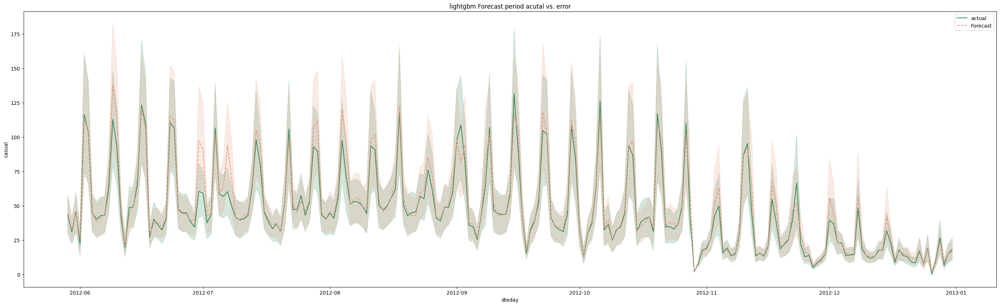

Forecast


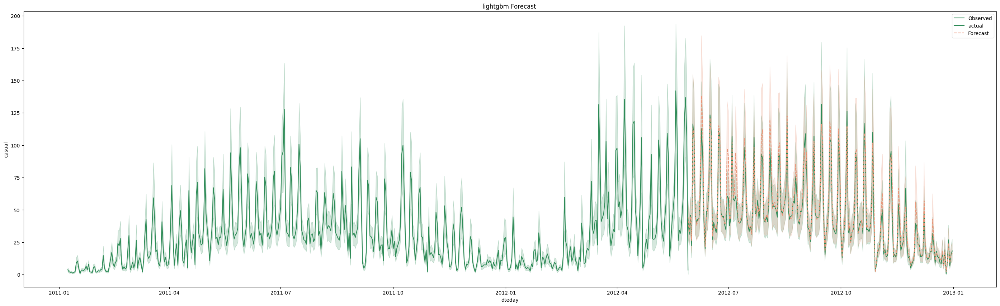

Residual over time plot


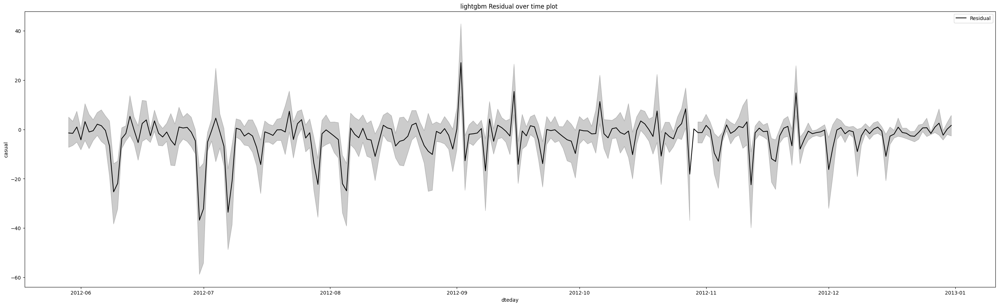

Histogram of Residuals


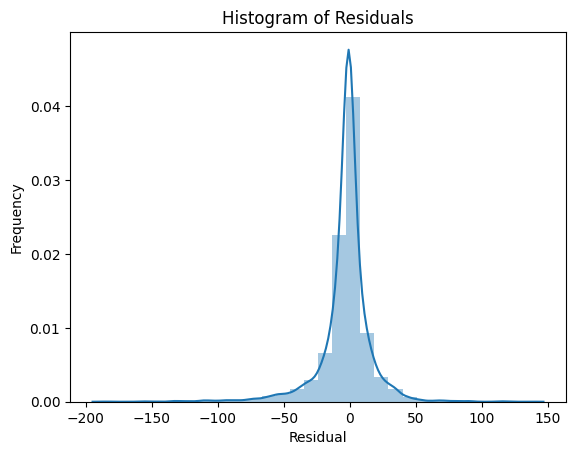

ACF and PACF of Residual
d:0, D:0,D_week:0


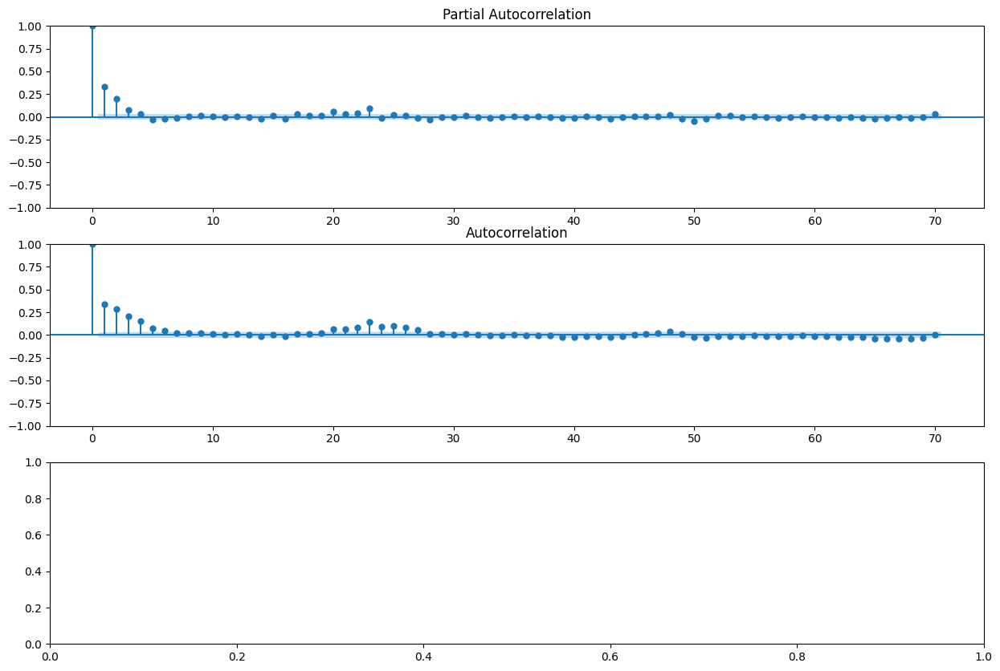

        Val Scores   Test scores  Test/Val %
RMSE  1.978865e+01  1.884460e+01   95.229332
MAPE  7.326189e+14  4.186765e+14   57.147933
MAE   1.033751e+01  1.071349e+01  103.637034


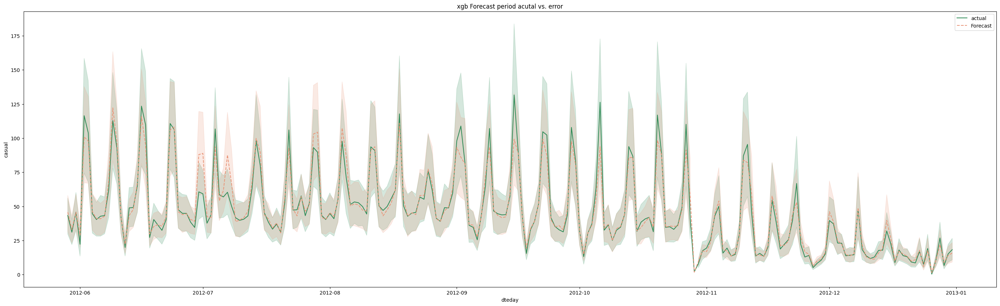

Forecast


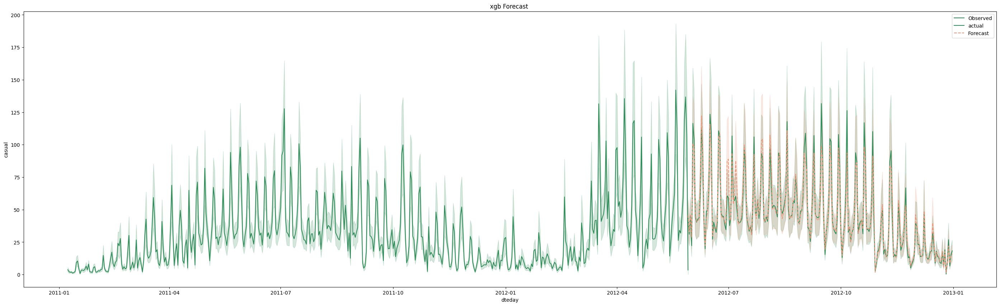

Residual over time plot


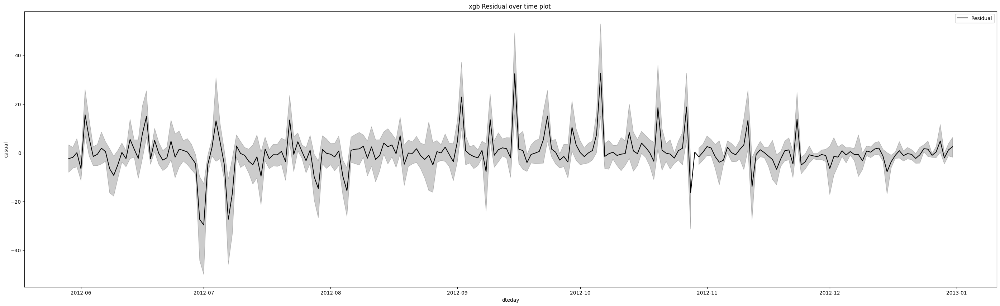

Histogram of Residuals


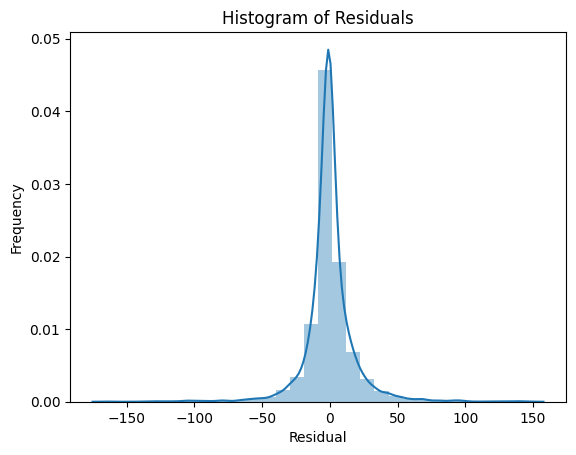

ACF and PACF of Residual
d:0, D:0,D_week:0


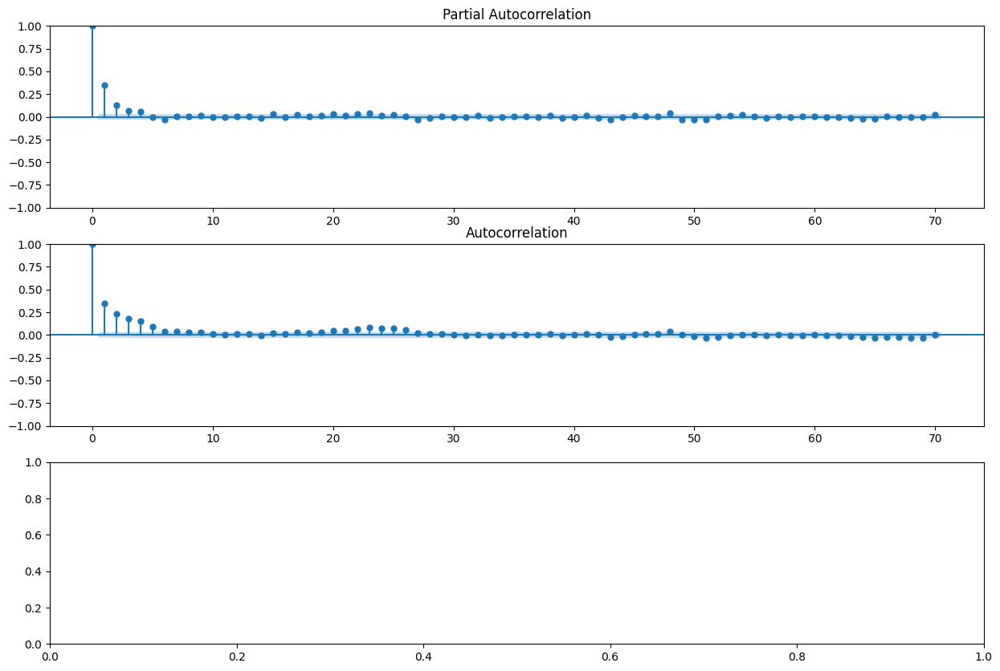

In [63]:
from sklearn.metrics import mean_absolute_percentage_error as MAPE   ###############FILLLL
from sklearn.metrics import mean_absolute_error as MAE #MAE
from sklearn.metrics import mean_squared_error as MSE #MSE
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
! pip install pmdarima
from pmdarima.arima.utils import ndiffs,nsdiffs
import warnings
from math import sqrt

for model in best_prediction:
  # Val score
  val_scores={}
  val_scores['RMSE']=-best_cv_results[model].loc[best_cv_results[model]['rank_test_RMSE']==1,'mean_test_RMSE'].values[0]
  val_scores['MAPE']=-best_cv_results[model].loc[best_cv_results[model]['rank_test_RMSE']==1,'mean_test_MAPE'].values[0]
  val_scores['MAE']=-best_cv_results[model].loc[best_cv_results[model]['rank_test_RMSE']==1,'mean_test_MAE'].values[0]

  Y_pred=best_prediction[model].iloc[:,0]

  #print(y_test.shape)
  residual=y_test-Y_pred.values
  #print(residual)



  test_scores={}
  test_scores['RMSE']=sqrt(MSE(y_test,Y_pred))
  test_scores['MAPE']=MAPE(y_test,Y_pred)
  test_scores['MAE']=MAE(y_test,Y_pred)

  result_df=pd.DataFrame({'Val Scores':val_scores,'Test scores':test_scores})
  result_df['Test/Val %']=result_df['Test scores']/result_df['Val Scores']*100
  print(result_df)


  dates_train=pd.to_datetime(data.iloc[0:len(X_train),0])
  dates_test=pd.to_datetime(data.iloc[len(X_train):,0])

  #plot
  plt.figure(figsize=(35, 10))
  sns.lineplot(x=dates_test,y= y_test, color='seagreen', label='actual')
  sns.lineplot(x=dates_test,y= Y_pred.values, color='darksalmon',linestyle='dashed', label='Forecast')
  plt.title(f"{model} Forecast period acutal vs. error")
  plt.show()
  # Plot historical data (train data)
  plt.figure(figsize=(35, 10))
  sns.lineplot(x=dates_train,y= y_train, label='Observed', color='seagreen')

  # plot actual
  sns.lineplot(x=dates_test,y= y_test, color='seagreen', label='actual')

  # Plot forecast
  print (f"Forecast")
  sns.lineplot(x=dates_test,y= Y_pred.values, color='darksalmon',linestyle='dashed', label='Forecast')
  plt.title(f"{model} Forecast ")
  plt.legend()
  plt.show()

  # Plot the residual # ignore sns warnings
  print("Residual over time plot")
  plt.figure(figsize=(35, 10))
  sns.lineplot(x=dates_test,y= residual, label='Residual', color='black',)
  plt.title(f"{model} Residual over time plot ")
  plt.legend()
  plt.show()

# ignore sns warnings
  print("Histogram of Residuals")
  # Temporarily suppress warnings
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sns.distplot(residual, bins=30)

  plt.title('Histogram of Residuals')
  plt.xlabel('Residual')
  plt.ylabel('Frequency')
  plt.show()

  # Plot ACF, PACF of Residual
  print("ACF and PACF of Residual")
  d = ndiffs(residual, alpha = 0.05, test='adf')  # regular differences?
  D_day = nsdiffs(residual, m = 24, test='ocsb') # # seasonal differences?
  D_week=nsdiffs(residual, m = 24*7, test='ocsb') # # seasonal differences?
  print(f"d:{d}, D:{D_day},D_week:{D_week}")
  nlags=70
  fig, ax = plt.subplots(3,1, figsize = (15,10))
  plot_pacf(residual, lags = nlags, method="ols", ax=ax[0])
  plot_acf(residual, lags = nlags, ax=ax[1])
  plt.show()

In [64]:
result_df

,Val Scores,Test scores,Test/Val %
RMSE,1.978865e+01,1.884460e+01,95.229332
MAPE,7.326189e+14,4.186765e+14,57.147933
MAE,1.033751e+01,1.071349e+01,103.637034


In [65]:
#### Best scores
##MAE: 12.23 lightgbm -- leo meins ist 11.1

save model for casual users

In [66]:
import pickle

# replace model_name with the name of your model object
model_name = best_estimator['lightgbm']

# replace file_path with the path and file name where you want to save the model
file_path = 'casual_user_lightgbm_model.pkl'

# save the model to disk
with open(file_path, 'wb') as file:
    pickle.dump(model_name, file)


----------------------------------------------------------------

## 2.4 Second Model for Target => **Registered users**

In [67]:
# Split predictors and target
target='registered'
non_target='casual'


X=data.drop(columns=[target,'dteday','datetime','cnt',non_target],inplace=False)
y=data[target]


print(X.dtypes)
print(X.shape,y.shape)

season                   int64
yr                       int64
mnth                     int64
hr                       int64
holiday                  int64
weekday                  int64
workingday               int64
weathersit               int64
temp                   float64
hum                    float64
windspeed              float64
lag_1_casual           float64
lag_2_casual           float64
lag_1_registered       float64
lag_2_registered       float64
hour_sin               float64
hour_cos               float64
lag_week_casual        float64
lag_24_casual          float64
lag_week_registered    float64
lag_24_registered      float64
dtype: object
(17211, 21) (17211,)


In [68]:

X_train=X[:train_set_size]


y_train_casual=y_train.copy() ## save for later
y_train=y[:train_set_size]


y_test_casual=y_test.copy() ## save for later

X_test=X[train_set_size:]
y_test=y[train_set_size:]


print(X_train.shape,X_test.shape,X.shape)

(12047, 21) (5164, 21) (17211, 21)




Why refitting on RMSE and not MAPE,MAE

--> **No to MAPE**: dont choose mape cause we have 0 actual values if prediction is 0.0001 then mape = infinity as we divide by 0 (actual value)

--> **Why RMSE over MAE** --> cause mae for eg. would not penalize high errors, but these can be very costly for the company if they buy new bikes cause of the prediction, but its infact an error. So i think trying to minimize the confidence interval is more valuable than predicting the demand 99% of the times right as this 1% wrong prediction can have high costs if its a overpredicction. And to my understanding this aim is best achieved by the RMSE instead of MAE. Better to be 100% close to right than 99% completlty right but 1% completley off.


In [69]:
import time

start_time=time.time()

# iterate over models and run the pipeline
for model, param_grid in zip(model_running,param_grids.values()):
  time.sleep(1)
  model_name=model.steps[-1][0] ## takes last steps in each pipeline and return the first element (which is the given name of the model)
  refit_metric='RMSE'
  grid_search = GridSearchCV(model, param_grid, cv=tscv, scoring={'RMSE':'neg_root_mean_squared_error','MAPE':'neg_mean_absolute_percentage_error','MAE':'neg_mean_absolute_error'},refit=refit_metric) #model=pipeline of the iteration, param_grid=paramgrid of iteration ,
  grid_search.fit(X_train, y_train)


  # Pipe feature-names through the pipeline to retain feature_importance (somehow feature names dont passthrough the pipeline)
  best_pipeline = grid_search.best_estimator_
  poly=best_pipeline.named_steps['clipper']
  feature_names_clipper = poly.get_feature_names_out(input_features=best_pipeline.named_steps['poly'].get_feature_names_out())
  rm_red_step=best_pipeline.named_steps['RmRedundant']
  names=rm_red_step.get_feature_names_out(input_features=feature_names_clipper)

  # linearmodel does not have a featrue names function
  if(model_name!='linreg'):
    feat_imp=best_pipeline.named_steps[model_name].feature_importances_
    feat_imp=pd.DataFrame({'var':names,'importance':feat_imp}).sort_values(by='importance',ascending=False)
    print(f"Feature importance of {model_name} \n {feat_imp}")

  # Print best score of best model
  print(f"{model_name} best score test {grid_search.score(X_test,y_test)} {refit_metric}")
  print(f"{model_name} best score val {grid_search.score(X_train,y_train)} {refit_metric}")


  # Fill scores into final dictionaries
  best_scores[model_name+"_2"]=grid_search.best_score_
  best_estimator[model_name+"_2"]=grid_search.best_estimator_
  best_cv_results[model_name+"_2"]=pd.DataFrame(grid_search.cv_results_)
  best_score[model_name+"_2"]=grid_search.score(X_test,y_test)
  best_prediction[model_name+"_2"]=pd.DataFrame(grid_search.predict(X_test))


  loop_round_time=time.time()-start_time
  print(f"{model_name} GS time elapsed: {loop_round_time}")

end_time=time.time()
gs_time=end_time-start_time

print(f"Total GS Time elapsed: {gs_time}" )


Feature importance of lightgbm 
                                var  importance
13  remainder__lag_week_registered         423
3                      polynom__hr         372
1                       quad__temp         338
12      remainder__lag_week_casual         244
2                        quad__hum         241
11             remainder__hour_cos         211
0                    quad__weekday         162
7            remainder__workingday         159
9             remainder__windspeed         151
10             remainder__hour_sin         145
4                remainder__season         127
5                    remainder__yr         123
8            remainder__weathersit         104
6               remainder__holiday           0
lightgbm best score test -63.10231774734824 RMSE
lightgbm best score val -26.684583735825502 RMSE
lightgbm GS time elapsed: 67.02334809303284
Feature importance of xgb 
                                var  importance
13  remainder__lag_week_registered    0.28107

In [70]:
lightgbm_results_2=pd.DataFrame(best_cv_results['lightgbm_2'].sort_values(by='rank_test_RMSE',ascending=True))
print(lightgbm_results_2.loc[0,'params'])

xgb_results_2=pd.DataFrame(best_cv_results['xgb_2'].sort_values(by='rank_test_RMSE',ascending=True))
print(xgb_results_2.loc[0,'params'])

{'RmRedundant__redundant': 1, 'clipper__factor': 1.5, 'lightgbm__bagging_fraction': 0.7, 'lightgbm__learning_rate': 0.1, 'lightgbm__min_data_in_leaf': None, 'lightgbm__n_estimators': 100, 'lightgbm__num_leaves': 10, 'poly__polynom__degree': 1, 'poly__quad__degree': 1}
{'RmRedundant__redundant': 1, 'clipper__factor': 1.5, 'poly__polynom__degree': 1, 'poly__quad__degree': 1, 'xgb__gamma': 0, 'xgb__learning_rate': 0.1, 'xgb__max_depth': 10, 'xgb__n_estimators': 100, 'xgb__subsample': 0.7}


In [71]:
best_cv_results

{'lightgbm':     mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
 0        0.093632      0.002509         0.028318        0.018094   
 1        0.142791      0.031737         0.014885        0.000658   
 2        0.122288      0.038565         0.014275        0.000738   
 3        0.116552      0.003452         0.013437        0.001624   
 4        0.073817      0.017198         0.013562        0.001109   
 ..            ...           ...              ...             ...   
 91       0.205419      0.012058         0.022401        0.003158   
 92       0.498624      0.151728         0.085885        0.078051   
 93       0.661915      0.296232         0.037553        0.005738   
 94       0.555769      0.125789         0.037526        0.008901   
 95       0.578588      0.212357         0.034748        0.003114   
 
    param_RmRedundant__redundant param_clipper__factor  \
 0                             1                   1.5   
 1                             1          

In [72]:
#save best cv results
best_cv_results['lightgbm_2'].to_csv('best_cv_results_registered_lightbm.csv')

In [73]:
# save best estimators as pickle file
import pickle
with open('registered_best_estimator.pkl', 'wb') as handle:
    pickle.dump(best_estimator, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [74]:
with open('registered_best_estimator.pkl', 'rb') as file:
    pipelines = pickle.load(file)

# Now you can use the pipelines as needed
# For example, to use the LightGBM pipeline:
lightgbm_pipeline = pipelines['lightgbm_2']
lightgbm_pipeline

Pipeline(steps=[('poly',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('quad',
                                                  PolynomialFeatures(degree=1,
                                                                     include_bias=False),
                                                  ['mnth', 'weekday', 'temp',
                                                   'hum']),
                                                 ('polynom',
                                                  PolynomialFeatures(degree=1,
                                                                     include_bias=False),
                                                  ['hr'])])),
                ('clipper', OutlierClipper()),
                ('RmRedundant',
                 RemoveRedundant(redundant=[0, 11, 12, 13, 14, 18, 20])),
                ('scaling', MinMaxScaler()),
                ('lightgbm',
                 LGBMRegressor(bagging_fraction=0.7, min_data_in_leaf=10,
                               n_estimators=200, num_leaves=15, seed=0,
                               verbose=-1))])

        Val Scores   Test scores  Test/Val %
RMSE  4.146554e+01  6.310232e+01  152.180146
MAPE  4.157844e+13  3.925804e+12    9.441924
MAE   2.575186e+01  4.107815e+01  159.515267
Forecast period actual vs. error


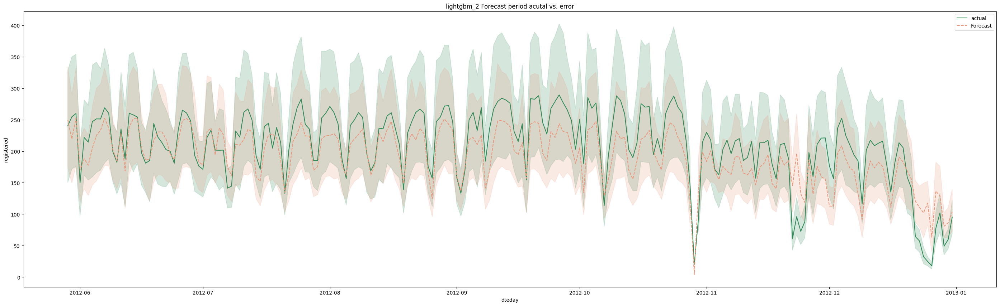

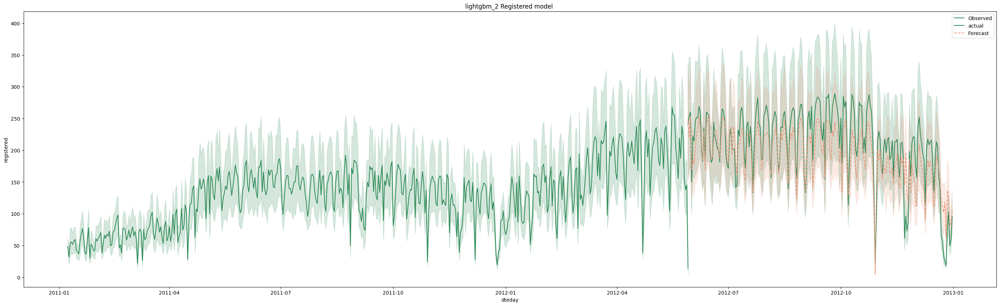

d:0, D:0,D_week:0
Residual over time plot


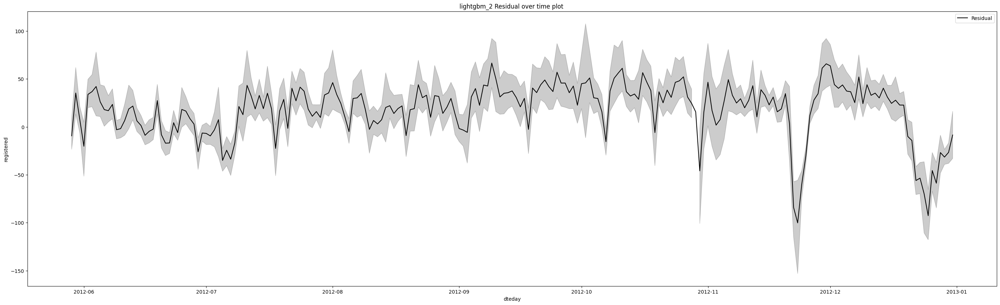

Histogram of Residuals


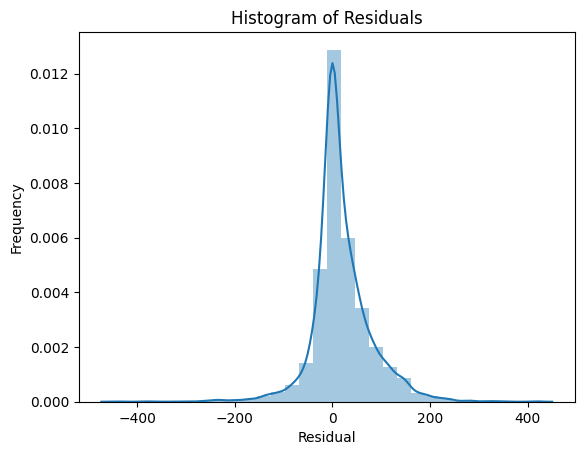

ACF and PACF of Residual


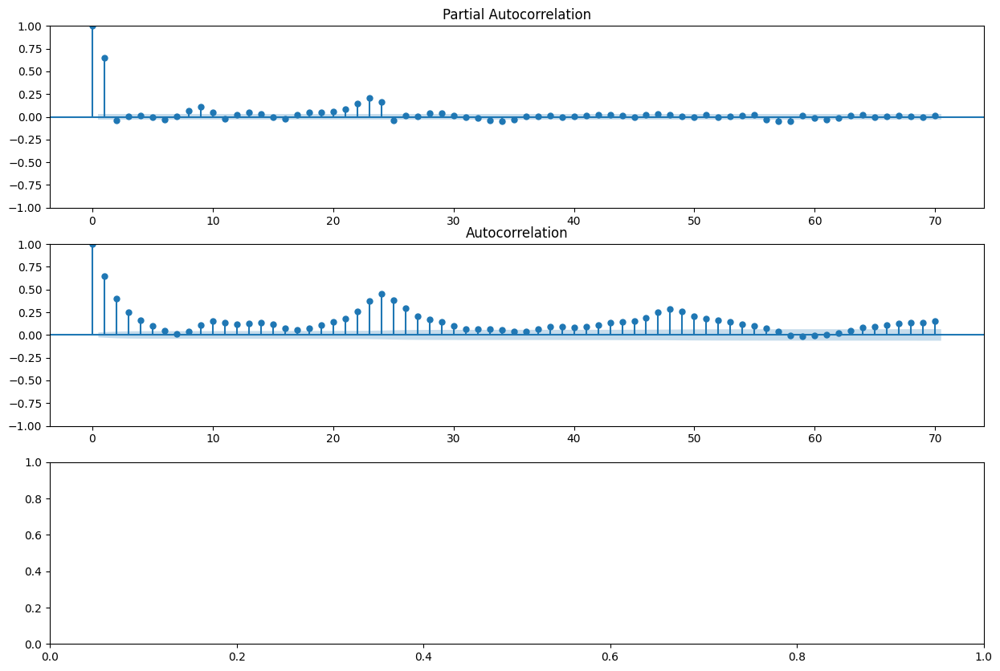

        Val Scores   Test scores  Test/Val %
RMSE  4.642622e+01  7.329762e+01  157.879783
MAPE  3.646135e+13  4.142137e+12   11.360351
MAE   2.778600e+01  4.644582e+01  167.155469
Forecast period actual vs. error


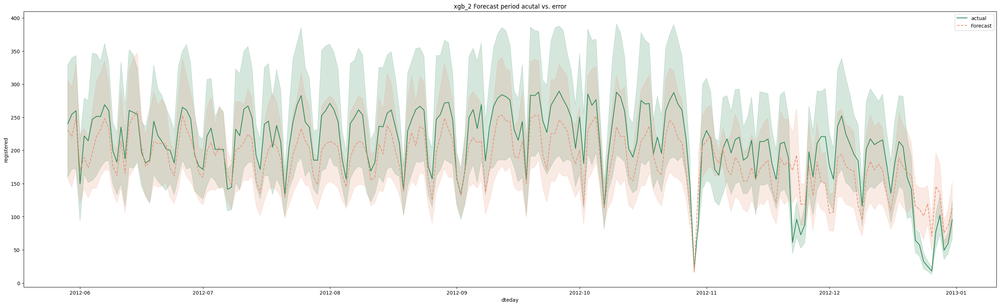

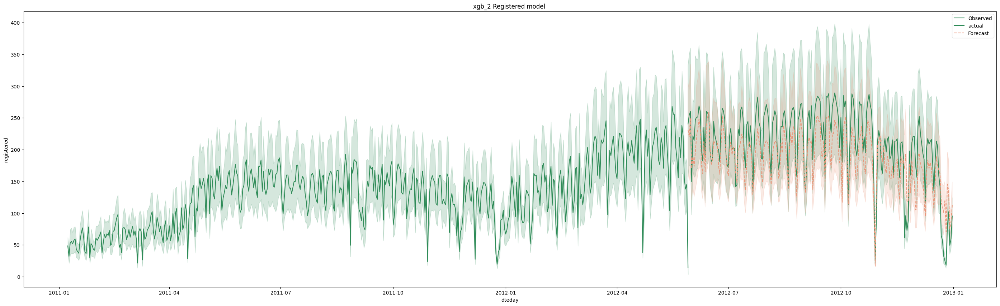

d:0, D:0,D_week:0
Residual over time plot


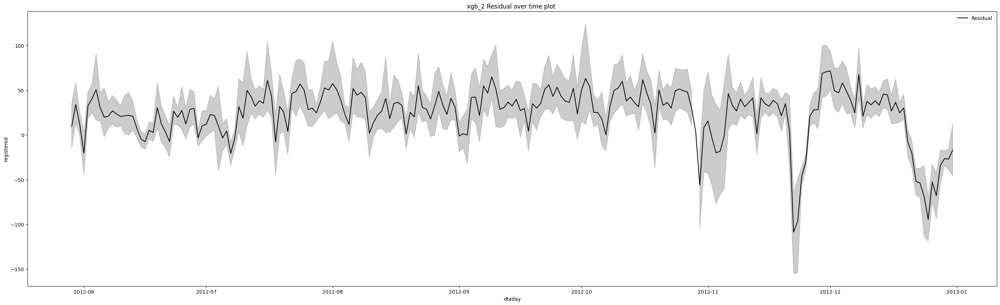

Histogram of Residuals


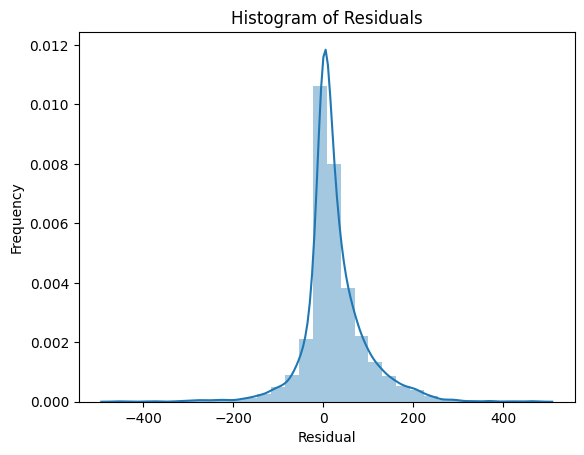

ACF and PACF of Residual


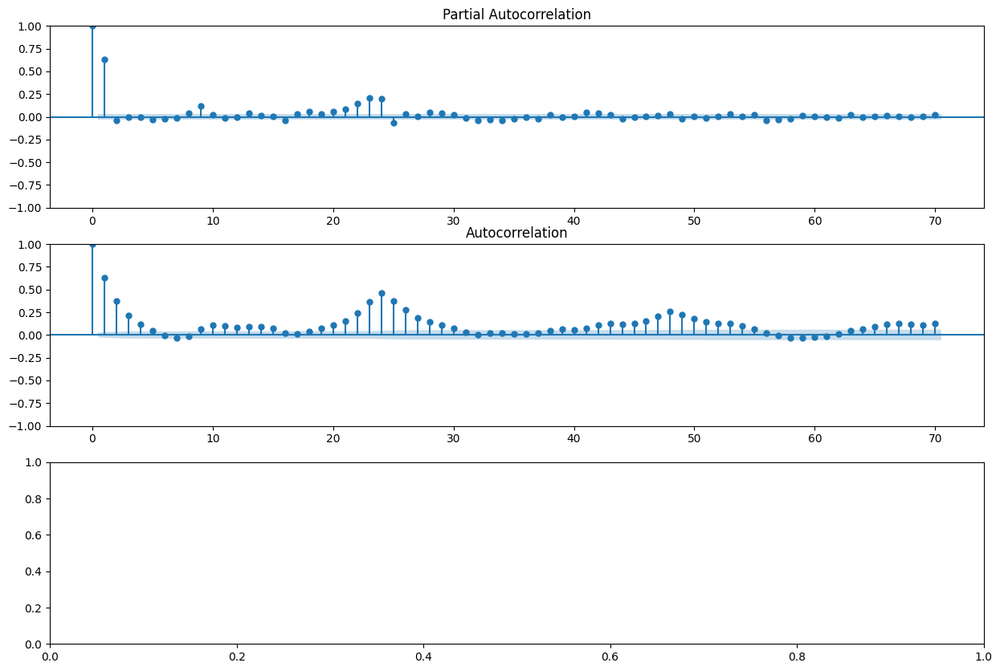

In [75]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#import warnings

for model in best_prediction:
  if '_2' in model:
    Y_pred=best_prediction[model].iloc[:,0]
    #print(y_test.shape)
    residual=y_test-Y_pred.values
    #print(residual)

    val_scores={}
    val_scores['RMSE']=-best_cv_results[model].loc[best_cv_results[model]['rank_test_RMSE']==1,'mean_test_RMSE'].values[0]
    val_scores['MAPE']=-best_cv_results[model].loc[best_cv_results[model]['rank_test_RMSE']==1,'mean_test_MAPE'].values[0]
    val_scores['MAE']=-best_cv_results[model].loc[best_cv_results[model]['rank_test_RMSE']==1,'mean_test_MAE'].values[0]


    test_scores={}
    test_scores['RMSE']=sqrt(MSE(y_test,Y_pred))
    test_scores['MAPE']=MAPE(y_test,Y_pred)
    test_scores['MAE']=MAE(y_test,Y_pred)

    result_df=pd.DataFrame({'Val Scores':val_scores,'Test scores':test_scores})
    result_df['Test/Val %']=result_df['Test scores']/result_df['Val Scores']*100
    print(result_df)


    dates_train=pd.to_datetime(data.iloc[0:len(X_train),0])
    dates_test=pd.to_datetime(data.iloc[len(X_train):,0])

    #plot
    print("Forecast period actual vs. error")
    plt.figure(figsize=(35, 10))
    sns.lineplot(x=dates_test,y= y_test, color='seagreen', label='actual')
    sns.lineplot(x=dates_test,y= Y_pred.values, color='darksalmon',linestyle='dashed', label='Forecast')
    plt.title(f"{model} Forecast period acutal vs. error")
    plt.show()

    # Plot historical data (train data)
    plt.figure(figsize=(35, 10))
    sns.lineplot(x=dates_train,y= y_train, label='Observed', color='seagreen')
    # plot actual
    sns.lineplot(x=dates_test,y= y_test, color='seagreen', label='actual')
    #´ Plot forecast
    sns.lineplot(x=dates_test,y= Y_pred.values, color='darksalmon',linestyle='dashed', label='Forecast')



    plt.title(f"{model} Registered model ")
    plt.legend()
    plt.show()
    d = ndiffs(residual, alpha = 0.05, test='adf')  # regular differences?
    D_day = nsdiffs(residual, m = 24, test='ocsb') # # seasonal differences?
    D_week=nsdiffs(residual, m = 24*7, test='ocsb') # # seasonal differences?
    print(f"d:{d}, D:{D_day},D_week:{D_week}")


    # Plot the residual
    print("Residual over time plot")
    plt.figure(figsize=(35, 10))
    sns.lineplot(x=dates_test,y= residual, label='Residual', color='black')
    plt.title(f"{model} Residual over time plot ")
    plt.legend()
    plt.show()

    print("Histogram of Residuals")
    with warnings.catch_warnings():
      warnings.simplefilter("ignore")
      sns.distplot(residual, bins=30)
    plt.title('Histogram of Residuals')
    plt.xlabel('Residual')
    plt.ylabel('Frequency')
    plt.show()

    # Plot ACF, PACF of Residual
    print("ACF and PACF of Residual")
    nlags=70
    fig, ax = plt.subplots(3,1, figsize = (15,10))
    plot_pacf(residual, lags = nlags, method="ols", ax=ax[0])
    plot_acf(residual, lags = nlags, ax=ax[1])
    plt.show()

In [76]:
print(best_prediction.keys())

print(best_prediction['lightgbm'])
print(best_prediction['lightgbm_2'])

dict_keys(['lightgbm', 'xgb', 'lightgbm_2', 'xgb_2'])
              0
0      1.428826
1      2.413562
2      7.264817
3     19.461832
4     35.783347
...         ...
5159   7.804530
5160   7.118444
5161   5.571670
5162   5.571670
5163   7.199879

[5164 rows x 1 columns]
               0
0      12.101321
1      31.783325
2     159.309514
3     372.479875
4     625.968231
...          ...
5159  186.372816
5160  124.733216
5161  102.621078
5162   55.574052
5163   37.556651

[5164 rows x 1 columns]


In [77]:
import pickle

# replace model_name with the name of your model object
model_name = best_estimator['lightgbm_2']

# replace file_path with the path and file name where you want to save the model
file_path = 'registered_user_lightgbm_model.pkl'

# save the model to disk
with open(file_path, 'wb') as file:
    pickle.dump(model_name, file)


---------------------------------------------

## 2.5 JOINING both Models

In [78]:
best_prediction
#save the best prediction
best_prediction['lightgbm_2'].to_csv('best_prediction.csv',index=False)


lightgbm
MAPE: 0.39531554140859443
RMSE: 66.61195142426425
MAE: 43.738479259385684


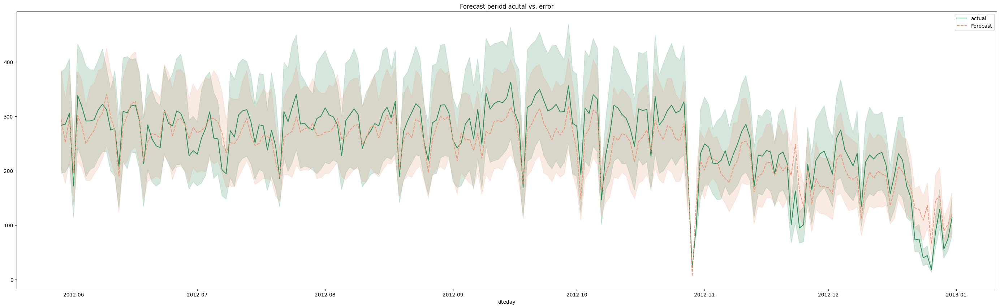

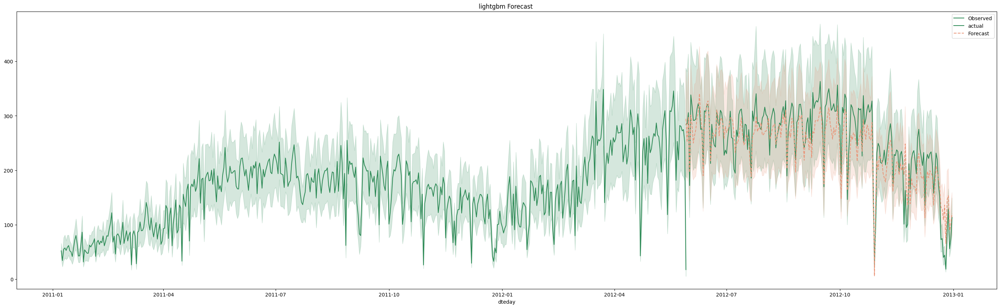

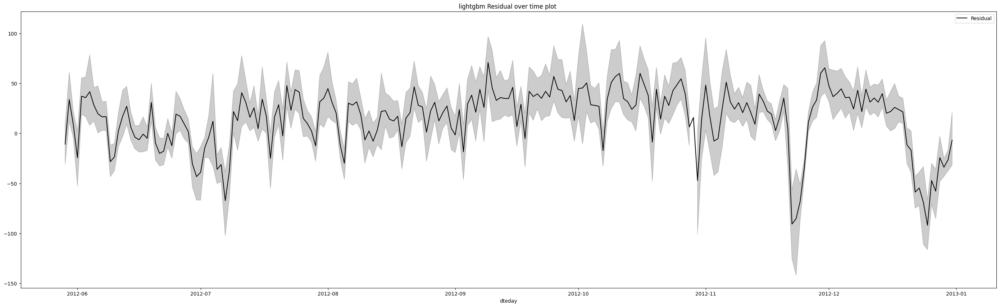

/var/folders/1n/phyrz16s0rd1_mpv046jgqf80000gn/T/ipykernel_88553/1929920166.py:60: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(residual, bins=30)


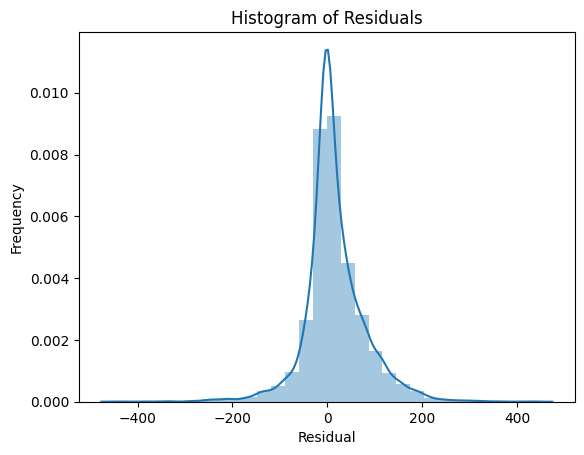

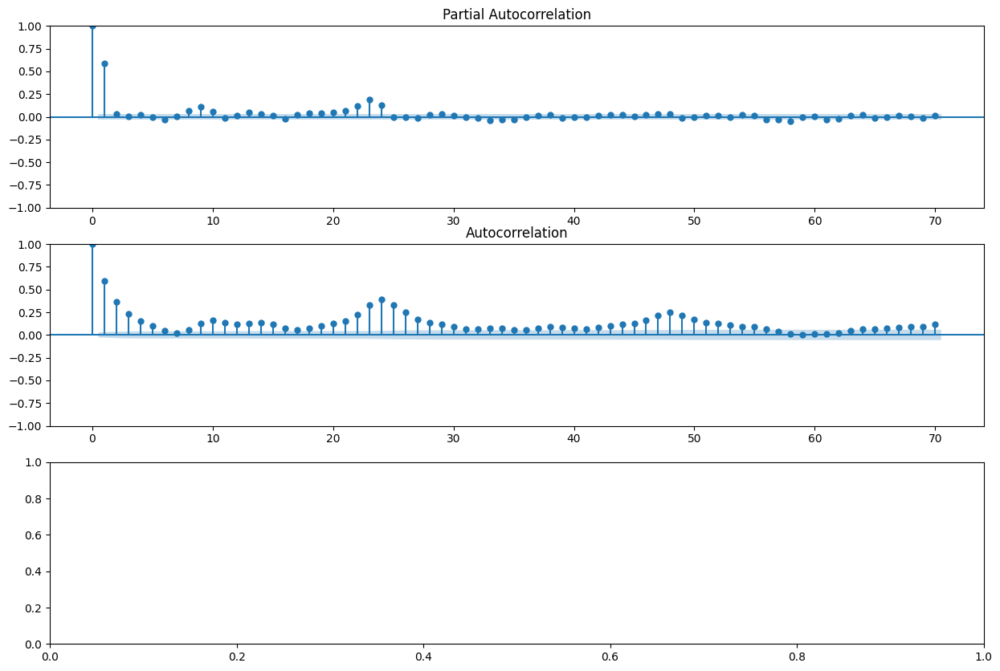

xgb
MAPE: 0.4337624056345097
RMSE: 77.60653838267594
MAE: 49.40491720646227


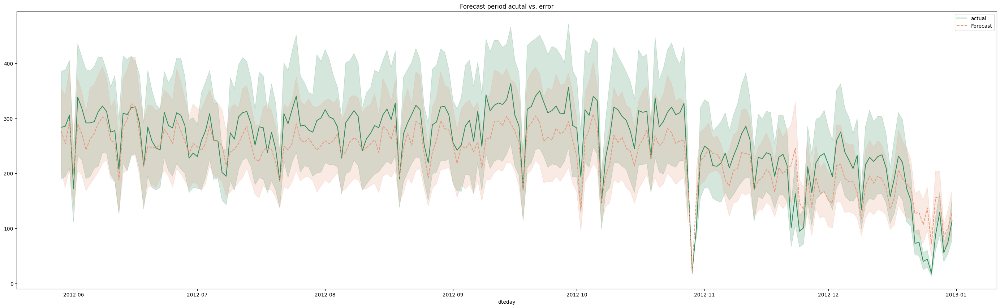

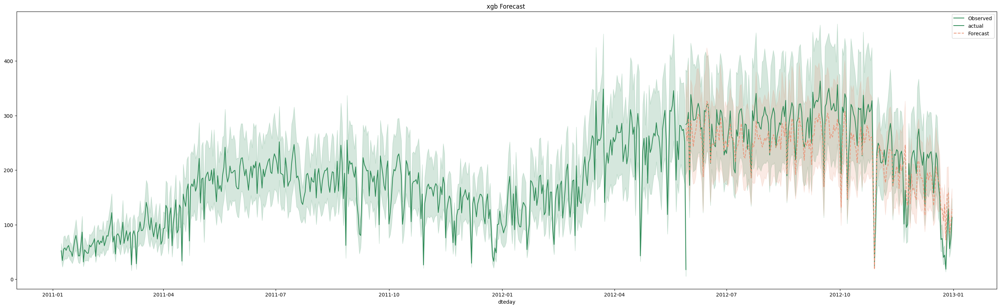

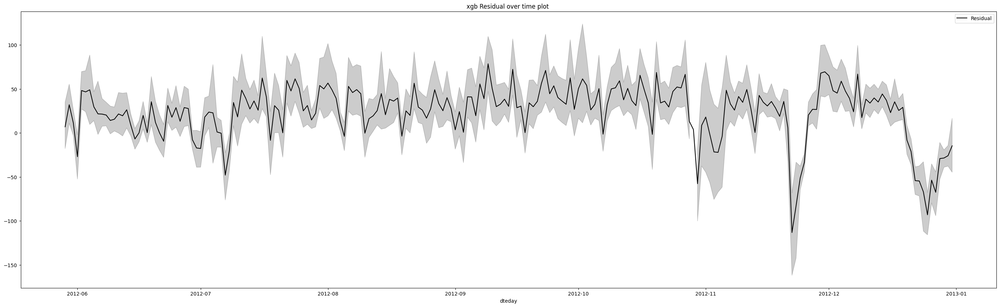

/var/folders/1n/phyrz16s0rd1_mpv046jgqf80000gn/T/ipykernel_88553/1929920166.py:60: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(residual, bins=30)


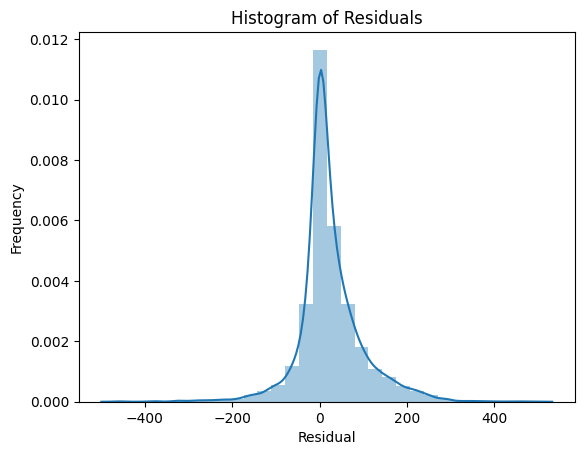

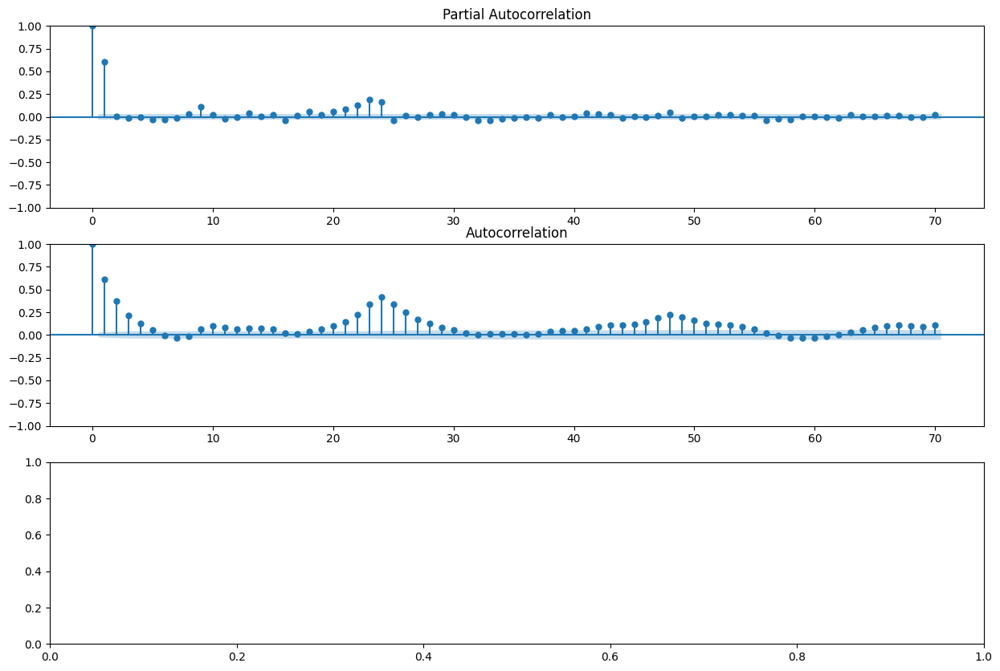

lightgbm_2

xgb_2



In [80]:
final_df=data.copy()



for model in best_prediction:
  print(model)
  if '_2' not in model:
    Y_pred_casual=best_prediction[model].iloc[:,0]
    Y_pred_reg=best_prediction[model+'_2'].iloc[:,0]
    Y_pred=Y_pred_casual.values+Y_pred_reg.values
    y_test_total=y_test_casual.values+y_test.values
    y_train_total=y_train.values+y_train_casual.values

    #print(y_test.shape)
    residual=y_test_total-Y_pred
    #print(residual)


    #print(y_test_total.head())
    #print(type(Y_pred))
    print(f"MAPE: {MAPE(y_test_total,Y_pred)}")
    print(f"RMSE: {sqrt(MSE(y_test_total,Y_pred))}")
    print(f"MAE: {MAE(y_test_total,Y_pred)}")


    dates_train=pd.to_datetime(data.iloc[0:len(X_train),0])
    dates_test=pd.to_datetime(data.iloc[len(X_train):,0])

    ###plot
    plt.figure(figsize=(35, 10))
    sns.lineplot(x=dates_test,y= y_test_total, color='seagreen', label='actual')
    sns.lineplot(x=dates_test,y= Y_pred, color='darksalmon',linestyle='dashed', label='Forecast')
    plt.title('Forecast period acutal vs. error')
    plt.show()

    # Plot historical data (train data)
    plt.figure(figsize=(35, 10))
    sns.lineplot(x=dates_train,y= y_train_total, label='Observed', color='seagreen')

    # plot actual
    sns.lineplot(x=dates_test,y= y_test_total, color='seagreen', label='actual')

    ## Plot forecast
    sns.lineplot(x=dates_test,y= Y_pred, color='darksalmon',linestyle='dashed', label='Forecast')



    plt.title(f"{model} Forecast ")
    plt.legend()
    plt.show()

    #### Plot the residual
    plt.figure(figsize=(35, 10))

    sns.lineplot(x=dates_test,y= residual, label='Residual', color='black')
    plt.title(f"{model} Residual over time plot ")
    plt.legend()
    plt.show()

    sns.distplot(residual, bins=30)
    plt.title('Histogram of Residuals')
    plt.xlabel('Residual')
    plt.ylabel('Frequency')
    plt.show()

    ### Plot ACF, PACF of Residual



    nlags=70
    fig, ax = plt.subplots(3,1, figsize = (15,10))
    plot_pacf(residual, lags = nlags, method="ols", ax=ax[0])
    plot_acf(residual, lags = nlags, ax=ax[1])
    plt.show()
  else:
    print("")



  final_df.loc[final_df.index[train_set_size:],f"casual_pred_{model}"]=Y_pred_casual.values
  final_df.loc[final_df.index[train_set_size:],f"registered_pred_{model}"]=Y_pred_reg.values
  final_df.loc[final_df.index[train_set_size:],f"total_pred_{model}"]=Y_pred_reg.values+Y_pred_casual.values


In [81]:
final_df.tail(10)

,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,...,total_pred_lightgbm,casual_pred_xgb,registered_pred_xgb,total_pred_xgb,casual_pred_lightgbm_2,registered_pred_lightgbm_2,total_pred_lightgbm_2,casual_pred_xgb_2,registered_pred_xgb_2,total_pred_xgb_2
instant,,,,,,,,,,,,,,,,,,,,,
17370,2012-12-31,1,1,12,14,0,1,1,2,0.28,...,131.364591,43.738766,91.786316,135.525085,43.738766,91.786316,135.525085,43.738766,91.786316,135.525085
17371,2012-12-31,1,1,12,15,0,1,1,2,0.28,...,154.080758,45.687447,95.303268,140.990723,45.687447,95.303268,140.990723,45.687447,95.303268,140.990723
17372,2012-12-31,1,1,12,16,0,1,1,2,0.26,...,211.781259,55.624088,154.052704,209.676788,55.624088,154.052704,209.676788,55.624088,154.052704,209.676788
17373,2012-12-31,1,1,12,17,0,1,1,2,0.26,...,281.641264,24.213135,268.535126,292.748260,24.213135,268.535126,292.748260,24.213135,268.535126,292.748260
17374,2012-12-31,1,1,12,18,0,1,1,2,0.26,...,229.385174,12.932446,228.316528,241.248978,12.932446,228.316528,241.248978,12.932446,228.316528,241.248978
17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,...,194.177347,8.530150,211.197571,219.727722,8.530150,211.197571,219.727722,8.530150,211.197571,219.727722
17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,...,131.851660,7.388232,170.839554,178.227783,7.388232,170.839554,178.227783,7.388232,170.839554,178.227783
17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,...,108.192748,5.354732,104.241447,109.596176,5.354732,104.241447,109.596176,5.354732,104.241447,109.596176
17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,...,61.145723,5.533402,92.351273,97.884674,5.533402,92.351273,97.884674,5.533402,92.351273,97.884674


In [82]:
final_df.loc[(final_df['casual']==0) & (~final_df['casual_pred_xgb'].isna()),['datetime','casual','casual_pred_xgb','casual_pred_lightgbm']]

,datetime,casual,casual_pred_xgb,casual_pred_lightgbm
instant,,,,
12216,2012-05-29 04:00:00,0,1.476998,1.428826
12237,2012-05-30 01:00:00,0,3.107739,2.121670
12239,2012-05-30 03:00:00,0,0.485053,0.194691
12240,2012-05-30 04:00:00,0,0.787060,1.136345
12263,2012-05-31 03:00:00,0,2.122013,2.759580
...,...,...,...,...
17339,2012-12-30 07:00:00,0,1.042520,5.016500
17359,2012-12-31 03:00:00,0,1.036898,0.411745
17360,2012-12-31 04:00:00,0,0.019909,0.411745


In [83]:
final_df.to_csv('bike_sharing_output.csv', index=False)

----------------------------------------


## 2.6 Easy model for target => **CNT**

This model is targeting the count `cnt` column.


**It will NOT take the specific differrences from both consumer groups into account.**

In [ ]:
"""# Split predictors and target
target='cnt'
X=data.drop(columns=[target,'dteday','datetime','registered','casual','lag_1_casual',
                     'lag_2_casual','lag_1_registered','lag_2_registered','hour_sin','hour_cos','lag_week_casual','lag_week_registered',
                     'lag_24_casual','lag_24_registered','lag_week_casual'],inplace=False)
y=data[target]


print(X.dtypes)
print(X.shape,y.shape)
print(X.info())



X_train=X[:train_set_size]
y_train=y[:train_set_size]


X_test=X[train_set_size:]
y_test=y[train_set_size:]


#print(X_train.shape,X_test.shape,X.shape)"""



"# Split predictors and target\ntarget='cnt'\nX=data.drop(columns=[target,'dteday','datetime','registered','casual','lag_1_casual',\n                     'lag_2_casual','lag_1_registered','lag_2_registered','hour_sin','hour_cos','lag_week_casual','lag_week_registered',\n                     'lag_24_casual','lag_24_registered','lag_week_casual'],inplace=False)\ny=data[target]\n\n\nprint(X.dtypes)\nprint(X.shape,y.shape)\nprint(X.info())\n\n\n\nX_train=X[:train_set_size]\ny_train=y[:train_set_size]\n\n\nX_test=X[train_set_size:]\ny_test=y[train_set_size:]\n\n\n#print(X_train.shape,X_test.shape,X.shape)"

In [ ]:
"""X.columns"""

'X.columns'

In [ ]:
"""### OHE
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(sparse=False)

cat_columns=['season','yr','mnth','holiday','weekday','workingday','weathersit']
cat_data_train=X_train[cat_columns]
cat_data_test=X_test[cat_columns]


encoder.fit(cat_data_train)
encoded_data_train= encoder.transform(cat_data_train)
encoded_data_test = encoder.transform(cat_data_test)

encoded_col_names = encoder.get_feature_names_out(cat_columns)



X_train=pd.DataFrame(encoded_data_train, columns=encoded_col_names)
X_test=pd.DataFrame(encoded_data_test, columns=encoded_col_names)
"""


"### OHE\nfrom sklearn.preprocessing import OneHotEncoder\n\nencoder = OneHotEncoder(sparse=False)\n\ncat_columns=['season','yr','mnth','holiday','weekday','workingday','weathersit']\ncat_data_train=X_train[cat_columns]\ncat_data_test=X_test[cat_columns]\n\n\nencoder.fit(cat_data_train)\nencoded_data_train= encoder.transform(cat_data_train)\nencoded_data_test = encoder.transform(cat_data_test)\n\nencoded_col_names = encoder.get_feature_names_out(cat_columns)\n\n\n\nX_train=pd.DataFrame(encoded_data_train, columns=encoded_col_names)\nX_test=pd.DataFrame(encoded_data_test, columns=encoded_col_names)\n"

### 2.6.1Structure of Target variable

In [ ]:
"""import statsmodels as sm
! pip install pmdarima
import pmdarima
from pmdarima.arima import ndiffs, nsdiffs
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

def acf_pacf(series,nlags,s,):

  fig, ax = plt.subplots(3,1, figsize = (15,10))
  plot_pacf(series, lags = nlags, method="ols", ax=ax[0])
  plot_acf(series, lags = nlags, ax=ax[1])
  ax[2] = plt.plot(series)
  plt.show()
  # Tests
  d = ndiffs(series, alpha = 0.05, test='adf')  # regular differences?
  D = nsdiffs(series, m = s, test='ocsb') # # seasonal differences?

  print("Regular differences: ", d)
  print('Seasonal differences:', D)

"""


'import statsmodels as sm\n! pip install pmdarima\nimport pmdarima\nfrom pmdarima.arima import ndiffs, nsdiffs\nfrom statsmodels.graphics.tsaplots import plot_acf, plot_pacf\n\ndef acf_pacf(series,nlags,s,):\n\n  fig, ax = plt.subplots(3,1, figsize = (15,10))\n  plot_pacf(series, lags = nlags, method="ols", ax=ax[0])\n  plot_acf(series, lags = nlags, ax=ax[1])\n  ax[2] = plt.plot(series)\n  plt.show()\n  # Tests\n  d = ndiffs(series, alpha = 0.05, test=\'adf\')  # regular differences?\n  D = nsdiffs(series, m = s, test=\'ocsb\') # # seasonal differences?\n\n  print("Regular differences: ", d)\n  print(\'Seasonal differences:\', D)\n\n'

In [ ]:
#acf_pacf(y_train,7*24,24)



In [ ]:
#series=y_train.diff(24).dropna()
#acf_pacf(series,200,24) ## --> now is stationary

**Observation**:   
- `stationary` ,but highly correlated --> acf shows high   seasonality

In [ ]:
#y_train

In [ ]:
"""seasonal_diff=0
regular_diff=0
s=24
import statsmodels.api as sm
series=y_train.diff(24).dropna()
model_1 = sm.tsa.arima.ARIMA(endog = series, exog = None, order = (2,regular_diff,0),seasonal_order=(0,seasonal_diff,0,s)).fit()
print(model_1.summary())

resi_1= model_1.resid[seasonal_diff*s+regular_diff:]
#resi_2= model_2.resid
acf_pacf(resi_1,nlags,s) # s==4 because of qurterly data
"""




'seasonal_diff=0\nregular_diff=0\ns=24\nimport statsmodels.api as sm\nseries=y_train.diff(24).dropna()\nmodel_1 = sm.tsa.arima.ARIMA(endog = series, exog = None, order = (2,regular_diff,0),seasonal_order=(0,seasonal_diff,0,s)).fit()\nprint(model_1.summary())\n\nresi_1= model_1.resid[seasonal_diff*s+regular_diff:]\n#resi_2= model_2.resid\nacf_pacf(resi_1,nlags,s) # s==4 because of qurterly data\n'

In [ ]:
"""from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import mean_absolute_percentage_error as MAPE

seasonal_diff=1
regular_diff=0
s=24
import statsmodels.api as sm


dates_train=pd.to_datetime(data.iloc[0:len(X_train),0])
dates_test=pd.to_datetime(data.iloc[len(X_train):,0])


#series_train=y_train.diff(24).dropna()
model_1 = sm.tsa.arima.ARIMA(endog = y_train, exog = None, order = (2,regular_diff,0),seasonal_order=(7,seasonal_diff,0,s)).fit()
print(model_1.summary())

resi_1= model_1.resid[seasonal_diff*s+regular_diff:]
#resi_2= model_2.resid
acf_pacf(resi_1,nlags,s) # s==4 because of qurterly data


########################

prediction=model_1.forecast(steps=len(y_test))


print(f"MSE: {MSE(y_test,prediction)}")
print(f"MAPE: {MAPE(y_test,prediction)}")

plt.figure(figsize=(35, 10))
sns.lineplot(x=data['datetime'],y=y, label='Observed', color='seagreen')
    #´ Plot forecast
sns.lineplot(x=dates_test,y= prediction, color='darksalmon',linestyle='dashed', label='Forecast')"""


'from sklearn.metrics import mean_squared_error as MSE\nfrom sklearn.metrics import mean_absolute_percentage_error as MAPE\n\nseasonal_diff=1\nregular_diff=0\ns=24\nimport statsmodels.api as sm\n\n\ndates_train=pd.to_datetime(data.iloc[0:len(X_train),0])\ndates_test=pd.to_datetime(data.iloc[len(X_train):,0])\n\n\n#series_train=y_train.diff(24).dropna()\nmodel_1 = sm.tsa.arima.ARIMA(endog = y_train, exog = None, order = (2,regular_diff,0),seasonal_order=(7,seasonal_diff,0,s)).fit()\nprint(model_1.summary())\n\nresi_1= model_1.resid[seasonal_diff*s+regular_diff:]\n#resi_2= model_2.resid\nacf_pacf(resi_1,nlags,s) # s==4 because of qurterly data\n\n\n########################\n\nprediction=model_1.forecast(steps=len(y_test))\n\n\nprint(f"MSE: {MSE(y_test,prediction)}")\nprint(f"MAPE: {MAPE(y_test,prediction)}")\n\nplt.figure(figsize=(35, 10))\nsns.lineplot(x=data[\'datetime\'],y=y, label=\'Observed\', color=\'seagreen\')\n    #´ Plot forecast\nsns.lineplot(x=dates_test,y= prediction, color=

In [ ]:
#sns.lineplot(x=dates_test,y= prediction, color='darksalmon',linestyle='dashed', label='Forecast')


__________________________________


### 2.6.2 Structure of temp

In [ ]:
#series=X_train.iloc[:,8]  ### temp series --> doesnt look stationary --> diff
#acf_pacf(series,40,24)

#series=X_train.iloc[:,8].diff().dropna() ## --> now is stationary
#acf_pacf(series,40,24)

**Observation**:   
-  Does `NOT` look stationary --> diff

____________________________________

### 2.6.3 Structure of hum

In [ ]:
"""series=X_train.iloc[:,9]

acf_pacf(series,40,24)

series=X_train.iloc[:,9].diff().dropna()""" ## --> now is stationary#acf_pacf(series,40,24)

'series=X_train.iloc[:,9]\n\nacf_pacf(series,40,24)\n\nseries=X_train.iloc[:,9].diff().dropna()'

___________________________________

### 2.6.4 Structure of windspeed

In [ ]:
"""series=X_train.iloc[:,10]  ### temp series --> doesnt look stationary --> diff

acf_pacf(series,40,24)

series=X_train.iloc[:,10].diff().dropna() ## --> now is stationary
acf_pacf(series,40,24)"""

'series=X_train.iloc[:,10]  ### temp series --> doesnt look stationary --> diff\n\nacf_pacf(series,40,24)\n\nseries=X_train.iloc[:,10].diff().dropna() ## --> now is stationary\nacf_pacf(series,40,24)'

_________________________________________________________

### 2.6.5 Simple Regression

only workday,windspeed not stat. signf. from 0

In [ ]:
"""import statsmodels.api as sm
reg1 = sm.OLS(y_train, X_train).fit()
reg1.summary()
"""


'import statsmodels.api as sm\nreg1 = sm.OLS(y_train, X_train).fit()\nreg1.summary()\n'

In [ ]:
"""resi=reg1.resid
acf_pacf(resi,40,24) ## plot the residual to see if WN or ARMA"""

'resi=reg1.resid\nacf_pacf(resi,40,24) ## plot the residual to see if WN or ARMA'

**OBSERVATIONS**:
- Looks stationary , but we see autocorrelations --> so not WN

In [ ]:
"""reg1 = sm.tsa.arima.ARIMA(resi, order = (3,0,0)).fit(method = 'innovations_mle')
reg1.summary()""" ### constant not significant, rest yes

"reg1 = sm.tsa.arima.ARIMA(resi, order = (3,0,0)).fit(method = 'innovations_mle')\nreg1.summary()"

In [ ]:
"""esi=reg1.resid
acf_pacf(resi,40,24)""" ## plot the residual of the transformed residual


'esi=reg1.resid\nacf_pacf(resi,40,24)'

**OBSERVATIONS**:
- Looks stationary but still lag 24 is significant

In [ ]:
"""reg1 = sm.tsa.statespace.SARIMAX(resi, order = (3,0,0),seasonal_order=(1,0,0,24)).fit(method = 'lbfgs')
reg1.summary()

resi2=reg1.resid
acf_pacf(resi2,40,24)""" ## Looks good


"reg1 = sm.tsa.statespace.SARIMAX(resi, order = (3,0,0),seasonal_order=(1,0,0,24)).fit(method = 'lbfgs')\nreg1.summary()\n\nresi2=reg1.resid\nacf_pacf(resi2,40,24)"

In [ ]:
"""reg1 = sm.tsa.statespace.SARIMAX(endog=y_train,exog=X_train, order = (8,1,0),seasonal_order=(1,0,0,24)).fit(method = 'lbfgs')
reg1.summary() ###

resi2=reg1.resid
acf_pacf(resi2,40,24)""" ## Looks good


"reg1 = sm.tsa.statespace.SARIMAX(endog=y_train,exog=X_train, order = (8,1,0),seasonal_order=(1,0,0,24)).fit(method = 'lbfgs')\nreg1.summary() ###\n\nresi2=reg1.resid\nacf_pacf(resi2,40,24)"

In [ ]:
#y_test.shape[0]

In [ ]:
"""forecast=reg1.get_forecast(steps=y_test.shape[0],exog=X_test)
mean_forecast=forecast.predicted_mean

pred=reg1.get_prediction(start=0,end=X_test.shape[0]-1,dynamic=False) #meine formel
print(pred)


# Plot historical data
plt.plot(X_train.index, y_train, label='Observed', color='blue')


##actual
forecast_index = range(len(X_train), len(X_train) + y_test.shape[0])

plt.plot(y_test.index, y_test, color='green', label='actual')


# Plot forecast
print(forecast_index)
plt.plot(forecast_index, pred.predicted_mean, color='red', label='Forecast')


# Plot confidence intervals
plt.fill_between(forecast_index, confidence_intervals.iloc[:, 0], confidence_intervals.iloc[:, 1], color='pink')

plt.title('SARIMAX Forecast with Exogenous Variables')
plt.legend()
plt.show()"""

"forecast=reg1.get_forecast(steps=y_test.shape[0],exog=X_test)\nmean_forecast=forecast.predicted_mean\n\npred=reg1.get_prediction(start=0,end=X_test.shape[0]-1,dynamic=False) #meine formel\nprint(pred)\n\n\n# Plot historical data\nplt.plot(X_train.index, y_train, label='Observed', color='blue')\n\n\n##actual\nforecast_index = range(len(X_train), len(X_train) + y_test.shape[0])\n\nplt.plot(y_test.index, y_test, color='green', label='actual')\n\n\n# Plot forecast\nprint(forecast_index)\nplt.plot(forecast_index, pred.predicted_mean, color='red', label='Forecast')\n\n\n# Plot confidence intervals\nplt.fill_between(forecast_index, confidence_intervals.iloc[:, 0], confidence_intervals.iloc[:, 1], color='pink')\n\nplt.title('SARIMAX Forecast with Exogenous Variables')\nplt.legend()\nplt.show()"

________________________________________________

________________________________________________________

# PART III: Streamlit dashboard

In [ ]:

!streamlit run Start.py



Usage: streamlit run [OPTIONS] TARGET [ARGS]...
Try 'streamlit run --help' for help.

Error: Invalid value: File does not exist: hello.py


In [4]:
import pandas as pd
final_df= pd.read_csv('data/final_df.csv')

In [8]:
final_df["lag_1_casual"].describe()

count    17211.000000
mean        35.964906
std         49.451965
min          0.000000
25%          4.000000
50%         17.000000
75%         49.000000
max        367.000000
Name: lag_1_casual, dtype: float64